[3. Creating machine learning model](#3)  
- [3.1.1 Load dataset prepared previousl](#3_1_1)  
- [3.1.2 Split into training and testing sets](#3_1_2)  

[3.2 Scalling values](#3_2)  

[3.3 Building deep learning model model](#3_3)  
- [3.3.1 Finding the best parameters](#3_3_1)  

[3.4 Predictions for all streets in San Francisco](#3_4)  
- [3.4.1 Load all streets (saved previously)](#3_4_1)  
- [3.4.2 Scale - exactly like we did it before with training dataset](#3_4_2)  
- [3.4.3 Make prediction](#3_4_3)  

[4. Result visualisation by coloring map](#4)  
- [4.1 Precentage of cars moving too fast - Over_pct](#4_1)  
- [4.2 Precentage of cars exceeding speed limit more than 5 mph - O5mph_pct](#4_2)  
- [4.3 Average speed - Speed_avg](#4_3)  
- [4.4 Average speed ovet speed limit - SpeedO_avg](#4_4)  
- [4.5 Average speed of cars exceeding speed limit for more than 5 mph - Spd5O_avg](#4_5)  

# 3. <a name="3"></a> Creating machine learning model

### 3.1.1 <a name="3_1_1"></a> Load dataset prepared previously

In [2]:
import pickle as pkl
import tensorflow as tf
speed_limit = pkl.load(open("speed_limit_ml_data_set.pkl", "rb"))


### 3.1.2 <a name="3_1_2"></a> Split into training and testing sets

In [3]:
X = speed_limit['data']
y = speed_limit['target']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [4]:
y_train

,Over_pct,O5mph_pct,Speed_avg,SpeedO_avg,Spd5O_avg
140,82.68,34.37,28.00,29.50,33.03
89,34.50,9.00,33.50,38.45,42.56
310,58.00,18.50,25.75,29.07,33.49
499,22.00,3.00,25.45,32.91,38.67
155,54.50,21.00,35.52,39.11,42.48
...,...,...,...,...,...
71,53.73,7.60,24.53,27.75,32.29
106,95.00,68.50,31.48,32.03,33.97
270,52.00,13.00,34.75,38.59,43.35
435,70.00,20.00,26.50,28.54,32.38


In [5]:
X_train

,length,maxspeed_15 mph,maxspeed_20 mph,maxspeed_25 mph,maxspeed_30 mph,maxspeed_35 mph,maxspeed_40 mph,maxspeed_65 mph,oneway_False,oneway_True,...,highway_primary,highway_primary_link,highway_residential,highway_secondary,highway_service,highway_tertiary,highway_trunk,highway_unclassified,centroid_X,centroid_Y
140,116.511,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,1,...,0,0,0,0,0,1,0,0,-122.444214,37.762877
89,13.597,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,...,0,0,0,0,0,1,0,0,-122.494441,37.741285
310,88.600,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0,1,...,0,0,0,1,0,0,0,0,-122.423335,37.757168
499,86.091,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,1,...,1,0,0,0,0,0,0,0,-122.389956,37.750132
155,50.658,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,1,...,1,0,0,0,0,0,0,0,-122.457824,37.740796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,123.102,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1,0,...,0,0,0,0,0,1,0,0,-122.448428,37.740177
106,798.304,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1,0,...,0,0,0,0,0,1,0,0,-122.486685,37.766229
270,394.562,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0,1,...,1,0,0,0,0,0,0,0,-122.471552,37.732848
435,197.357,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1,0,...,0,0,0,0,0,1,0,0,-122.432745,37.748962


## 3.2 <a name="3_2"></a> Scalling values

We are going to scale all values to range 0;1 for better ML performance.
First we subtract minimum value from columns with centroids - so new minimal value will be 0

In [6]:
X_train['centroid_Y'] = X_train['centroid_Y'] - X_train['centroid_Y'].min()
X_train['centroid_X'] = X_train['centroid_X'] - X_train['centroid_X'].min()
X_test['centroid_Y'] = X_test['centroid_Y'] - X_test['centroid_Y'].min()
X_test['centroid_X'] = X_test['centroid_X'] - X_test['centroid_X'].min()

In [7]:
X_train[['centroid_X', 'centroid_Y']]

,centroid_X,centroid_Y
140,0.068483,0.054079
89,0.018256,0.032486
310,0.089362,0.048370
499,0.122741,0.041333
155,0.054873,0.031998
...,...,...
71,0.064269,0.031379
106,0.026012,0.057431
270,0.041145,0.024050
435,0.079951,0.040164


Then we divide all columns by max value in each column so all values are scaled to range 0;1

In [8]:
for col in X_train.columns:
    if max(X_train[col]) != 0:
        X_train[col] = X_train[col] / max(X_train[col])

In [9]:
X_train

,length,maxspeed_15 mph,maxspeed_20 mph,maxspeed_25 mph,maxspeed_30 mph,maxspeed_35 mph,maxspeed_40 mph,maxspeed_65 mph,oneway_False,oneway_True,...,highway_primary,highway_primary_link,highway_residential,highway_secondary,highway_service,highway_tertiary,highway_trunk,highway_unclassified,centroid_X,centroid_Y
140,0.145948,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.490044,0.552627
89,0.017032,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.130633,0.331975
310,0.110985,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.639448,0.494289
499,0.107842,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.878299,0.422381
155,0.063457,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.392656,0.326980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,0.154204,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.459887,0.320657
106,1.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.186134,0.586881
270,0.494250,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.294419,0.245763
435,0.247220,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.572109,0.410429


In [10]:
for col in X_test.columns:
    if max(X_test[col]) != 0:
        X_test[col] = X_test[col] / max(X_test[col])

In [11]:
X_test

,length,maxspeed_15 mph,maxspeed_20 mph,maxspeed_25 mph,maxspeed_30 mph,maxspeed_35 mph,maxspeed_40 mph,maxspeed_65 mph,oneway_False,oneway_True,...,highway_primary,highway_primary_link,highway_residential,highway_secondary,highway_service,highway_tertiary,highway_trunk,highway_unclassified,centroid_X,centroid_Y
231,0.412808,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0,0.0,1.0,0,0.0,0,0.0,0.524779,1.000000
374,0.149577,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0,0.0,1.0,0,0.0,0,0.0,0.720888,0.747281
55,0.047132,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0,0.0,0.0,0,1.0,0,0.0,0.929681,0.923131
381,0.102273,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0,0.0,1.0,0,0.0,0,0.0,0.849928,0.709462
70,0.125774,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0,0.0,0.0,0,1.0,0,0.0,0.503543,0.312227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11,0.301440,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0,0.0,0.0,0,0.0,0,0.0,0.988066,0.596585
281,0.389558,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0,1.0,0.0,0,0.0,0,0.0,0.511699,0.223205
22,0.038809,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0,0.0,1.0,0,0.0,0,0.0,0.865756,0.704313
375,0.143964,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0,1.0,0.0,0,0.0,0,0.0,0.223499,0.122569


## 3.3 <a name="3_3"></a> Building deep learning model model
We use code from our ML labs

This functions will generate model based of parameters provided

In [12]:
def build_model(n_hidden=1, n_neurons=25, optimizer="sgd", learning_rate=0.00001, momentum=0): 
    model = tf.keras.models.Sequential()
    model.add(tf.keras.layers.InputLayer(input_shape=X_train.shape[1:]))
    
    for i in range(n_hidden):
        model.add(tf.keras.layers.Dense(n_neurons, activation="relu"))
    
    model.add(tf.keras.layers.Dense(5))
    opt = None
    
    #optimizers
    if optimizer == "sgd":
        opt = tf.keras.optimizers.get("sgd")
        opt.learning_rate = learning_rate
    elif optimizer == "nesterov":
        opt = tf.keras.optimizers.get("sgd")
        opt.learning_rate = learning_rate
        opt.nesterov = True
    elif optimizer == "momentum":
        opt = tf.keras.optimizers.get("sgd")
        opt.learning_rate = learning_rate
        opt.momentum = momentum
    elif optimizer == "adam":
        opt = tf.keras.optimizers.get("adam")
        opt.learning_rate = learning_rate
    
    model.compile(loss="mean_squared_error",
              optimizer=opt,
              metrics=["mean_absolute_error"])

    return model

We will find best parameters using randomizer search CV algorithm  
Early stopping callback will prevent overfitting

In [15]:
import scikeras
from scikeras.wrappers import KerasRegressor

"""
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
"""

param_distribs = {
"model__n_hidden": [0,1,2,3],
"model__n_neurons": [5,25,125],
"model__learning_rate": [0.00001,0.0001, 0.001],
"model__optimizer": ['sgd', 'nesterov', 'momentum', 'adam'],
"model__momentum": [0.1,0.5,0.9]
}

es = tf.keras.callbacks.EarlyStopping(patience=10, min_delta=1.0, verbose=1)

keras_reg = KerasRegressor(build_model)



from sklearn.model_selection import RandomizedSearchCV
rnd_search_cv = RandomizedSearchCV(keras_reg,
param_distribs,
n_iter=30,
cv=3,
verbose=2)
rnd_search_cv.fit(X_train, y_train, epochs=100, validation_split=0.1, callbacks=[es])

Fitting 3 folds for each of 30 candidates, totalling 90 fits
Epoch 1/100
9/9 [==============================] - 1s 42ms/step - loss: 1354.3877 - mean_absolute_error: 32.3397 - val_loss: 1503.7147 - val_mean_absolute_error: 33.8865
Epoch 2/100
9/9 [==============================] - 0s 9ms/step - loss: 1342.0771 - mean_absolute_error: 32.1679 - val_loss: 1489.2113 - val_mean_absolute_error: 33.6792
Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 1324.9797 - mean_absolute_error: 31.9122 - val_loss: 1465.0123 - val_mean_absolute_error: 33.3179
Epoch 4/100
9/9 [==============================] - 0s 5ms/step - loss: 1288.9288 - mean_absolute_error: 31.3607 - val_loss: 1400.6809 - val_mean_absolute_error: 32.3350
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 1163.4766 - mean_absolute_error: 29.3833 - val_loss: 1083.1470 - val_mean_absolute_error: 27.2428
Epoch 6/100
9/9 [==============================] - 0s 5ms/step - loss: 602.5993 - mean_absolu

Epoch 50/100
9/9 [==============================] - 0s 5ms/step - loss: 198.5441 - mean_absolute_error: 8.8613 - val_loss: 249.4767 - val_mean_absolute_error: 9.7575
Epoch 51/100
9/9 [==============================] - 0s 5ms/step - loss: 197.3739 - mean_absolute_error: 8.8952 - val_loss: 245.9931 - val_mean_absolute_error: 9.6816
Epoch 52/100
9/9 [==============================] - 0s 5ms/step - loss: 198.4492 - mean_absolute_error: 8.9276 - val_loss: 275.1004 - val_mean_absolute_error: 10.4276
Epoch 53/100
9/9 [==============================] - 0s 5ms/step - loss: 199.7164 - mean_absolute_error: 8.9718 - val_loss: 247.9886 - val_mean_absolute_error: 9.7378
Epoch 54/100
9/9 [==============================] - 0s 5ms/step - loss: 198.3355 - mean_absolute_error: 8.9112 - val_loss: 259.2933 - val_mean_absolute_error: 9.9082
Epoch 55/100
9/9 [==============================] - 0s 5ms/step - loss: 197.6151 - mean_absolute_error: 8.8945 - val_loss: 255.3746 - val_mean_absolute_error: 9.8223
Epo

9/9 [==============================] - 0s 5ms/step - loss: 179.6881 - mean_absolute_error: 8.5147 - val_loss: 234.7521 - val_mean_absolute_error: 9.7404
Epoch 48/100
9/9 [==============================] - 0s 5ms/step - loss: 178.8519 - mean_absolute_error: 8.4779 - val_loss: 232.7616 - val_mean_absolute_error: 9.9242
Epoch 49/100
9/9 [==============================] - 0s 5ms/step - loss: 180.1334 - mean_absolute_error: 8.6418 - val_loss: 242.6394 - val_mean_absolute_error: 9.5580
Epoch 50/100
9/9 [==============================] - 0s 5ms/step - loss: 179.2018 - mean_absolute_error: 8.5339 - val_loss: 232.6250 - val_mean_absolute_error: 9.8283
Epoch 51/100
9/9 [==============================] - 0s 5ms/step - loss: 179.6056 - mean_absolute_error: 8.5163 - val_loss: 243.8545 - val_mean_absolute_error: 9.5916
Epoch 52/100
9/9 [==============================] - 0s 5ms/step - loss: 178.9731 - mean_absolute_error: 8.5768 - val_loss: 238.6774 - val_mean_absolute_error: 9.5580
Epoch 53/100
9/9 

9/9 [==============================] - 0s 5ms/step - loss: 191.8359 - mean_absolute_error: 9.0388 - val_loss: 223.9742 - val_mean_absolute_error: 9.7858
Epoch 45/100
9/9 [==============================] - 0s 4ms/step - loss: 191.3514 - mean_absolute_error: 8.9943 - val_loss: 206.6123 - val_mean_absolute_error: 9.2508
Epoch 46/100
9/9 [==============================] - 0s 4ms/step - loss: 188.8989 - mean_absolute_error: 8.8924 - val_loss: 204.2198 - val_mean_absolute_error: 9.1473
Epoch 47/100
9/9 [==============================] - 0s 5ms/step - loss: 188.4951 - mean_absolute_error: 8.8860 - val_loss: 204.1258 - val_mean_absolute_error: 9.1526
Epoch 48/100
9/9 [==============================] - 0s 5ms/step - loss: 189.8763 - mean_absolute_error: 8.9230 - val_loss: 204.0310 - val_mean_absolute_error: 9.1769
Epoch 49/100
9/9 [==============================] - 0s 5ms/step - loss: 187.8287 - mean_absolute_error: 8.8576 - val_loss: 210.9782 - val_mean_absolute_error: 9.4778
Epoch 50/100
9/9 

9/9 [==============================] - 0s 5ms/step - loss: 1326.7458 - mean_absolute_error: 32.0096 - val_loss: 1481.1761 - val_mean_absolute_error: 33.6300
Epoch 41/100
9/9 [==============================] - 0s 5ms/step - loss: 1325.9017 - mean_absolute_error: 31.9976 - val_loss: 1480.2882 - val_mean_absolute_error: 33.6177
Epoch 42/100
9/9 [==============================] - 0s 4ms/step - loss: 1325.0590 - mean_absolute_error: 31.9857 - val_loss: 1479.4000 - val_mean_absolute_error: 33.6055
Epoch 43/100
9/9 [==============================] - 0s 4ms/step - loss: 1324.2196 - mean_absolute_error: 31.9739 - val_loss: 1478.5074 - val_mean_absolute_error: 33.5932
Epoch 44/100
9/9 [==============================] - 0s 4ms/step - loss: 1323.3735 - mean_absolute_error: 31.9619 - val_loss: 1477.6222 - val_mean_absolute_error: 33.5811
Epoch 45/100
9/9 [==============================] - 0s 5ms/step - loss: 1322.5363 - mean_absolute_error: 31.9501 - val_loss: 1476.7430 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 1206.1462 - mean_absolute_error: 30.5124 - val_loss: 1382.7704 - val_mean_absolute_error: 32.3201
Epoch 36/100
9/9 [==============================] - 0s 5ms/step - loss: 1198.2694 - mean_absolute_error: 30.3993 - val_loss: 1373.5007 - val_mean_absolute_error: 32.1923
Epoch 37/100
9/9 [==============================] - 0s 5ms/step - loss: 1189.8098 - mean_absolute_error: 30.2773 - val_loss: 1363.6381 - val_mean_absolute_error: 32.0559
Epoch 38/100
9/9 [==============================] - 0s 5ms/step - loss: 1180.8303 - mean_absolute_error: 30.1466 - val_loss: 1353.3615 - val_mean_absolute_error: 31.9126
Epoch 39/100
9/9 [==============================] - 0s 5ms/step - loss: 1171.4336 - mean_absolute_error: 30.0109 - val_loss: 1342.3599 - val_mean_absolute_error: 31.7587
Epoch 40/100
9/9 [==============================] - 0s 5ms/step - loss: 1161.3785 - mean_absolute_error: 29.8633 - val_loss: 1330.6310 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 6ms/step - loss: 1027.9222 - mean_absolute_error: 27.5719 - val_loss: 990.8017 - val_mean_absolute_error: 26.8651
Epoch 31/100
9/9 [==============================] - 0s 4ms/step - loss: 1007.1997 - mean_absolute_error: 27.2474 - val_loss: 970.1957 - val_mean_absolute_error: 26.5227
Epoch 32/100
9/9 [==============================] - 0s 5ms/step - loss: 985.5516 - mean_absolute_error: 26.9123 - val_loss: 948.8846 - val_mean_absolute_error: 26.1712
Epoch 33/100
9/9 [==============================] - 0s 9ms/step - loss: 963.1646 - mean_absolute_error: 26.5597 - val_loss: 926.7195 - val_mean_absolute_error: 25.8044
Epoch 34/100
9/9 [==============================] - 0s 4ms/step - loss: 939.8928 - mean_absolute_error: 26.1898 - val_loss: 903.6076 - val_mean_absolute_error: 25.4166
Epoch 35/100
9/9 [==============================] - 0s 5ms/step - loss: 915.6064 - mean_absolute_error: 25.8021 - val_loss: 879.6803 - val_mean_absolute_error: 25.0109
Epo

Epoch 79/100
9/9 [==============================] - 0s 5ms/step - loss: 212.4527 - mean_absolute_error: 9.6971 - val_loss: 237.8850 - val_mean_absolute_error: 10.5256
Epoch 80/100
9/9 [==============================] - 0s 5ms/step - loss: 211.2274 - mean_absolute_error: 9.6688 - val_loss: 237.2699 - val_mean_absolute_error: 10.5076
Epoch 81/100
9/9 [==============================] - 0s 5ms/step - loss: 210.2752 - mean_absolute_error: 9.6444 - val_loss: 236.7482 - val_mean_absolute_error: 10.4912
Epoch 82/100
9/9 [==============================] - 0s 6ms/step - loss: 209.5034 - mean_absolute_error: 9.6277 - val_loss: 236.2700 - val_mean_absolute_error: 10.4765
Epoch 83/100
9/9 [==============================] - 0s 5ms/step - loss: 208.6751 - mean_absolute_error: 9.6143 - val_loss: 235.8675 - val_mean_absolute_error: 10.4624
Epoch 84/100
9/9 [==============================] - 0s 5ms/step - loss: 207.9844 - mean_absolute_error: 9.6062 - val_loss: 235.5910 - val_mean_absolute_error: 10.450

9/9 [==============================] - 0s 6ms/step - loss: 1341.1805 - mean_absolute_error: 32.2302 - val_loss: 1495.5601 - val_mean_absolute_error: 33.8652
Epoch 75/100
9/9 [==============================] - 0s 5ms/step - loss: 1340.9742 - mean_absolute_error: 32.2274 - val_loss: 1495.3320 - val_mean_absolute_error: 33.8621
Epoch 76/100
9/9 [==============================] - 0s 5ms/step - loss: 1340.7635 - mean_absolute_error: 32.2245 - val_loss: 1495.1097 - val_mean_absolute_error: 33.8591
Epoch 77/100
9/9 [==============================] - 0s 5ms/step - loss: 1340.5579 - mean_absolute_error: 32.2217 - val_loss: 1494.8879 - val_mean_absolute_error: 33.8561
Epoch 78/100
9/9 [==============================] - 0s 5ms/step - loss: 1340.3516 - mean_absolute_error: 32.2188 - val_loss: 1494.6656 - val_mean_absolute_error: 33.8532
Epoch 79/100
9/9 [==============================] - 0s 4ms/step - loss: 1340.1458 - mean_absolute_error: 32.2160 - val_loss: 1494.4445 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 5ms/step - loss: 1290.3574 - mean_absolute_error: 31.6832 - val_loss: 1482.1578 - val_mean_absolute_error: 33.6266
Epoch 70/100
9/9 [==============================] - 0s 4ms/step - loss: 1290.1577 - mean_absolute_error: 31.6804 - val_loss: 1481.9384 - val_mean_absolute_error: 33.6236
Epoch 71/100
9/9 [==============================] - 0s 5ms/step - loss: 1289.9591 - mean_absolute_error: 31.6776 - val_loss: 1481.7156 - val_mean_absolute_error: 33.6206
Epoch 72/100
9/9 [==============================] - 0s 5ms/step - loss: 1289.7576 - mean_absolute_error: 31.6747 - val_loss: 1481.4968 - val_mean_absolute_error: 33.6177
Epoch 73/100
9/9 [==============================] - 0s 5ms/step - loss: 1289.5597 - mean_absolute_error: 31.6720 - val_loss: 1481.2769 - val_mean_absolute_error: 33.6147
Epoch 74/100
9/9 [==============================] - 0s 5ms/step - loss: 1289.3604 - mean_absolute_error: 31.6692 - val_loss: 1481.0594 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 5ms/step - loss: 1311.9473 - mean_absolute_error: 31.8858 - val_loss: 1274.1122 - val_mean_absolute_error: 31.4668
Epoch 65/100
9/9 [==============================] - 0s 5ms/step - loss: 1311.7391 - mean_absolute_error: 31.8830 - val_loss: 1273.9143 - val_mean_absolute_error: 31.4639
Epoch 66/100
9/9 [==============================] - 0s 4ms/step - loss: 1311.5364 - mean_absolute_error: 31.8801 - val_loss: 1273.7147 - val_mean_absolute_error: 31.4609
Epoch 67/100
9/9 [==============================] - 0s 5ms/step - loss: 1311.3303 - mean_absolute_error: 31.8773 - val_loss: 1273.5161 - val_mean_absolute_error: 31.4580
Epoch 68/100
9/9 [==============================] - 0s 5ms/step - loss: 1311.1266 - mean_absolute_error: 31.8744 - val_loss: 1273.3184 - val_mean_absolute_error: 31.4551
Epoch 69/100
9/9 [==============================] - 0s 5ms/step - loss: 1310.9232 - mean_absolute_error: 31.8717 - val_loss: 1273.1191 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 5ms/step - loss: 1354.8606 - mean_absolute_error: 32.4278 - val_loss: 1505.4083 - val_mean_absolute_error: 34.0332
Epoch 60/100
9/9 [==============================] - 0s 8ms/step - loss: 1354.8217 - mean_absolute_error: 32.4273 - val_loss: 1505.3640 - val_mean_absolute_error: 34.0327
Epoch 61/100
9/9 [==============================] - 0s 5ms/step - loss: 1354.7823 - mean_absolute_error: 32.4268 - val_loss: 1505.3203 - val_mean_absolute_error: 34.0322
Epoch 62/100
9/9 [==============================] - 0s 4ms/step - loss: 1354.7437 - mean_absolute_error: 32.4264 - val_loss: 1505.2765 - val_mean_absolute_error: 34.0318
Epoch 63/100
9/9 [==============================] - 0s 5ms/step - loss: 1354.7045 - mean_absolute_error: 32.4259 - val_loss: 1505.2327 - val_mean_absolute_error: 34.0313
Epoch 64/100
9/9 [==============================] - 0s 5ms/step - loss: 1354.6654 - mean_absolute_error: 32.4255 - val_loss: 1505.1884 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 5ms/step - loss: 1320.6047 - mean_absolute_error: 32.1114 - val_loss: 1517.6621 - val_mean_absolute_error: 34.1088
Epoch 55/100
9/9 [==============================] - 0s 5ms/step - loss: 1320.5905 - mean_absolute_error: 32.1112 - val_loss: 1517.6458 - val_mean_absolute_error: 34.1086
Epoch 56/100
9/9 [==============================] - 0s 5ms/step - loss: 1320.5759 - mean_absolute_error: 32.1110 - val_loss: 1517.6300 - val_mean_absolute_error: 34.1084
Epoch 57/100
9/9 [==============================] - 0s 5ms/step - loss: 1320.5616 - mean_absolute_error: 32.1108 - val_loss: 1517.6138 - val_mean_absolute_error: 34.1082
Epoch 58/100
9/9 [==============================] - 0s 5ms/step - loss: 1320.5476 - mean_absolute_error: 32.1106 - val_loss: 1517.5978 - val_mean_absolute_error: 34.1080
Epoch 59/100
9/9 [==============================] - 0s 5ms/step - loss: 1320.5333 - mean_absolute_error: 32.1104 - val_loss: 1517.5817 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 7ms/step - loss: 1329.3215 - mean_absolute_error: 32.2022 - val_loss: 1296.5865 - val_mean_absolute_error: 31.8562
Epoch 50/100
9/9 [==============================] - 0s 5ms/step - loss: 1329.2974 - mean_absolute_error: 32.2018 - val_loss: 1296.5634 - val_mean_absolute_error: 31.8558
Epoch 51/100
9/9 [==============================] - 0s 5ms/step - loss: 1329.2731 - mean_absolute_error: 32.2015 - val_loss: 1296.5404 - val_mean_absolute_error: 31.8555
Epoch 52/100
9/9 [==============================] - 0s 5ms/step - loss: 1329.2487 - mean_absolute_error: 32.2011 - val_loss: 1296.5172 - val_mean_absolute_error: 31.8551
Epoch 53/100
9/9 [==============================] - 0s 5ms/step - loss: 1329.2246 - mean_absolute_error: 32.2008 - val_loss: 1296.4938 - val_mean_absolute_error: 31.8548
Epoch 54/100
9/9 [==============================] - 0s 4ms/step - loss: 1329.2001 - mean_absolute_error: 32.2004 - val_loss: 1296.4706 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 5ms/step - loss: 198.4925 - mean_absolute_error: 8.9515 - val_loss: 242.7705 - val_mean_absolute_error: 9.5509
Epoch 46/100
9/9 [==============================] - 0s 5ms/step - loss: 196.4991 - mean_absolute_error: 8.9026 - val_loss: 253.6321 - val_mean_absolute_error: 9.7575
Epoch 47/100
9/9 [==============================] - 0s 5ms/step - loss: 195.4389 - mean_absolute_error: 8.8414 - val_loss: 260.2820 - val_mean_absolute_error: 9.9654
Epoch 48/100
9/9 [==============================] - 0s 5ms/step - loss: 195.1864 - mean_absolute_error: 8.7349 - val_loss: 257.9911 - val_mean_absolute_error: 9.8716
Epoch 49/100
9/9 [==============================] - 0s 5ms/step - loss: 195.3017 - mean_absolute_error: 8.7715 - val_loss: 247.4580 - val_mean_absolute_error: 9.5718
Epoch 50/100
9/9 [==============================] - 0s 4ms/step - loss: 196.6503 - mean_absolute_error: 8.8205 - val_loss: 241.7436 - val_mean_absolute_error: 9.5263
Epoch 51/100
9/9 

9/9 [==============================] - 0s 5ms/step - loss: 178.2437 - mean_absolute_error: 8.5431 - val_loss: 231.2345 - val_mean_absolute_error: 9.5119
Epoch 43/100
9/9 [==============================] - 0s 5ms/step - loss: 177.5938 - mean_absolute_error: 8.4726 - val_loss: 229.0384 - val_mean_absolute_error: 9.7059
Epoch 44/100
9/9 [==============================] - 0s 5ms/step - loss: 178.7911 - mean_absolute_error: 8.5470 - val_loss: 233.4244 - val_mean_absolute_error: 9.4222
Epoch 45/100
9/9 [==============================] - 0s 5ms/step - loss: 176.9861 - mean_absolute_error: 8.4518 - val_loss: 233.4382 - val_mean_absolute_error: 9.4609
Epoch 46/100
9/9 [==============================] - 0s 5ms/step - loss: 177.2986 - mean_absolute_error: 8.4616 - val_loss: 229.6542 - val_mean_absolute_error: 9.4530
Epoch 47/100
9/9 [==============================] - 0s 5ms/step - loss: 177.6138 - mean_absolute_error: 8.5223 - val_loss: 240.4273 - val_mean_absolute_error: 9.4552
Epoch 48/100
9/9 

9/9 [==============================] - 0s 5ms/step - loss: 188.0468 - mean_absolute_error: 8.8821 - val_loss: 204.5288 - val_mean_absolute_error: 9.2581
Epoch 40/100
9/9 [==============================] - 0s 5ms/step - loss: 187.9258 - mean_absolute_error: 8.8941 - val_loss: 205.1614 - val_mean_absolute_error: 9.2882
Epoch 41/100
9/9 [==============================] - 0s 5ms/step - loss: 187.9139 - mean_absolute_error: 8.9568 - val_loss: 203.1624 - val_mean_absolute_error: 9.0976
Epoch 42/100
9/9 [==============================] - 0s 5ms/step - loss: 186.8520 - mean_absolute_error: 8.8662 - val_loss: 210.5146 - val_mean_absolute_error: 9.4319
Epoch 43/100
9/9 [==============================] - 0s 5ms/step - loss: 188.3226 - mean_absolute_error: 8.8750 - val_loss: 203.0542 - val_mean_absolute_error: 9.0978
Epoch 44/100
9/9 [==============================] - 0s 5ms/step - loss: 188.3273 - mean_absolute_error: 8.8932 - val_loss: 203.2923 - val_mean_absolute_error: 9.0972
Epoch 45/100
9/9 

9/9 [==============================] - 0s 5ms/step - loss: 1338.6244 - mean_absolute_error: 32.1708 - val_loss: 1495.2155 - val_mean_absolute_error: 33.8178
Epoch 36/100
9/9 [==============================] - 0s 5ms/step - loss: 1338.3446 - mean_absolute_error: 32.1670 - val_loss: 1494.9271 - val_mean_absolute_error: 33.8140
Epoch 37/100
9/9 [==============================] - 0s 7ms/step - loss: 1338.0630 - mean_absolute_error: 32.1633 - val_loss: 1494.6367 - val_mean_absolute_error: 33.8102
Epoch 38/100
9/9 [==============================] - 0s 6ms/step - loss: 1337.7806 - mean_absolute_error: 32.1594 - val_loss: 1494.3516 - val_mean_absolute_error: 33.8065
Epoch 39/100
9/9 [==============================] - 0s 6ms/step - loss: 1337.5023 - mean_absolute_error: 32.1557 - val_loss: 1494.0580 - val_mean_absolute_error: 33.8026
Epoch 40/100
9/9 [==============================] - 0s 6ms/step - loss: 1337.2172 - mean_absolute_error: 32.1518 - val_loss: 1493.7670 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 8ms/step - loss: 1321.8099 - mean_absolute_error: 32.1758 - val_loss: 1522.5032 - val_mean_absolute_error: 34.2219
Epoch 31/100
9/9 [==============================] - 0s 5ms/step - loss: 1321.4515 - mean_absolute_error: 32.1708 - val_loss: 1522.0917 - val_mean_absolute_error: 34.2165
Epoch 32/100
9/9 [==============================] - 0s 5ms/step - loss: 1321.0929 - mean_absolute_error: 32.1658 - val_loss: 1521.6848 - val_mean_absolute_error: 34.2112
Epoch 33/100
9/9 [==============================] - 0s 5ms/step - loss: 1320.7383 - mean_absolute_error: 32.1609 - val_loss: 1521.2794 - val_mean_absolute_error: 34.2059
Epoch 34/100
9/9 [==============================] - 0s 5ms/step - loss: 1320.3862 - mean_absolute_error: 32.1561 - val_loss: 1520.8777 - val_mean_absolute_error: 34.2007
Epoch 35/100
9/9 [==============================] - 0s 5ms/step - loss: 1320.0359 - mean_absolute_error: 32.1512 - val_loss: 1520.4766 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 9ms/step - loss: 1324.9615 - mean_absolute_error: 32.0796 - val_loss: 1289.0455 - val_mean_absolute_error: 31.7168
Epoch 26/100
9/9 [==============================] - 0s 5ms/step - loss: 1324.7383 - mean_absolute_error: 32.0765 - val_loss: 1288.8248 - val_mean_absolute_error: 31.7135
Epoch 27/100
9/9 [==============================] - 0s 5ms/step - loss: 1324.5127 - mean_absolute_error: 32.0733 - val_loss: 1288.6038 - val_mean_absolute_error: 31.7103
Epoch 28/100
9/9 [==============================] - 0s 5ms/step - loss: 1324.2869 - mean_absolute_error: 32.0702 - val_loss: 1288.3817 - val_mean_absolute_error: 31.7071
Epoch 29/100
9/9 [==============================] - 0s 5ms/step - loss: 1324.0594 - mean_absolute_error: 32.0670 - val_loss: 1288.1584 - val_mean_absolute_error: 31.7038
Epoch 30/100
9/9 [==============================] - 0s 5ms/step - loss: 1323.8297 - mean_absolute_error: 32.0638 - val_loss: 1287.9373 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 210.2358 - mean_absolute_error: 9.4603 - val_loss: 243.3504 - val_mean_absolute_error: 10.2716
Epoch 21/100
9/9 [==============================] - 0s 4ms/step - loss: 209.7455 - mean_absolute_error: 9.4449 - val_loss: 242.3525 - val_mean_absolute_error: 10.2382
Epoch 22/100
9/9 [==============================] - 0s 5ms/step - loss: 209.2989 - mean_absolute_error: 9.4508 - val_loss: 244.1449 - val_mean_absolute_error: 10.2358
Epoch 23/100
9/9 [==============================] - 0s 7ms/step - loss: 209.0484 - mean_absolute_error: 9.4277 - val_loss: 245.2503 - val_mean_absolute_error: 10.1909
Epoch 24/100
9/9 [==============================] - 0s 9ms/step - loss: 208.8781 - mean_absolute_error: 9.3888 - val_loss: 244.4205 - val_mean_absolute_error: 10.1557
Epoch 25/100
9/9 [==============================] - 0s 11ms/step - loss: 207.9162 - mean_absolute_error: 9.3575 - val_loss: 244.5068 - val_mean_absolute_error: 10.1515
Epoch 26/1

9/9 [==============================] - 0s 6ms/step - loss: 192.7645 - mean_absolute_error: 9.1633 - val_loss: 241.5152 - val_mean_absolute_error: 10.2116
Epoch 18/100
9/9 [==============================] - 0s 6ms/step - loss: 192.5293 - mean_absolute_error: 9.1541 - val_loss: 240.7180 - val_mean_absolute_error: 10.1980
Epoch 19/100
9/9 [==============================] - 0s 6ms/step - loss: 192.1940 - mean_absolute_error: 9.1449 - val_loss: 240.2524 - val_mean_absolute_error: 10.1925
Epoch 20/100
9/9 [==============================] - 0s 7ms/step - loss: 191.4188 - mean_absolute_error: 9.1231 - val_loss: 240.5226 - val_mean_absolute_error: 10.1767
Epoch 21/100
9/9 [==============================] - 0s 8ms/step - loss: 191.3377 - mean_absolute_error: 9.0921 - val_loss: 239.3941 - val_mean_absolute_error: 10.1558
Epoch 22/100
9/9 [==============================] - 0s 7ms/step - loss: 190.7574 - mean_absolute_error: 9.0926 - val_loss: 238.9184 - val_mean_absolute_error: 10.1215
Epoch 23/10

9/9 [==============================] - 0s 7ms/step - loss: 202.3666 - mean_absolute_error: 9.5379 - val_loss: 229.8387 - val_mean_absolute_error: 10.3295
Epoch 15/100
9/9 [==============================] - 0s 7ms/step - loss: 201.7046 - mean_absolute_error: 9.5074 - val_loss: 229.2374 - val_mean_absolute_error: 10.3035
Epoch 16/100
9/9 [==============================] - 0s 6ms/step - loss: 201.5168 - mean_absolute_error: 9.4990 - val_loss: 228.0169 - val_mean_absolute_error: 10.2443
Epoch 17/100
9/9 [==============================] - 0s 5ms/step - loss: 201.0277 - mean_absolute_error: 9.4693 - val_loss: 227.5982 - val_mean_absolute_error: 10.2213
Epoch 18/100
9/9 [==============================] - 0s 5ms/step - loss: 200.4081 - mean_absolute_error: 9.4684 - val_loss: 227.7726 - val_mean_absolute_error: 10.2170
Epoch 19/100
9/9 [==============================] - 0s 5ms/step - loss: 200.0388 - mean_absolute_error: 9.4339 - val_loss: 228.3414 - val_mean_absolute_error: 10.2297
Epoch 20/10

9/9 [==============================] - 0s 4ms/step - loss: 1338.2343 - mean_absolute_error: 32.1660 - val_loss: 1495.3628 - val_mean_absolute_error: 33.8179
Epoch 12/100
9/9 [==============================] - 0s 6ms/step - loss: 1335.3955 - mean_absolute_error: 32.1254 - val_loss: 1492.3062 - val_mean_absolute_error: 33.7755
Epoch 13/100
9/9 [==============================] - 0s 5ms/step - loss: 1332.4155 - mean_absolute_error: 32.0820 - val_loss: 1489.0161 - val_mean_absolute_error: 33.7296
Epoch 14/100
9/9 [==============================] - 0s 6ms/step - loss: 1329.1832 - mean_absolute_error: 32.0351 - val_loss: 1485.5399 - val_mean_absolute_error: 33.6806
Epoch 15/100
9/9 [==============================] - 0s 6ms/step - loss: 1325.7332 - mean_absolute_error: 31.9847 - val_loss: 1481.7213 - val_mean_absolute_error: 33.6265
Epoch 16/100
9/9 [==============================] - 0s 4ms/step - loss: 1321.9093 - mean_absolute_error: 31.9292 - val_loss: 1477.5455 - val_mean_absolute_error: 3

Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 1301.7087 - mean_absolute_error: 31.8868 - val_loss: 1493.2115 - val_mean_absolute_error: 33.8249
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 1299.1544 - mean_absolute_error: 31.8523 - val_loss: 1490.2515 - val_mean_absolute_error: 33.7862
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 1296.4598 - mean_absolute_error: 31.8158 - val_loss: 1487.1030 - val_mean_absolute_error: 33.7450
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 1293.6062 - mean_absolute_error: 31.7775 - val_loss: 1483.8396 - val_mean_absolute_error: 33.7023
Epoch 11/100
9/9 [==============================] - 0s 4ms/step - loss: 1290.6086 - mean_absolute_error: 31.7370 - val_loss: 1480.2994 - val_mean_absolute_error: 33.6558
Epoch 12/100
9/9 [==============================] - 0s 4ms/step - loss: 1287.3242 - mean_absolute_error: 31.6922 - val_loss: 1476.4114 - val_mean_absolut

Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 1325.9265 - mean_absolute_error: 32.0989 - val_loss: 1289.0547 - val_mean_absolute_error: 31.7048
Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 1323.1221 - mean_absolute_error: 32.0638 - val_loss: 1286.3208 - val_mean_absolute_error: 31.6692
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 1320.2611 - mean_absolute_error: 32.0278 - val_loss: 1283.5837 - val_mean_absolute_error: 31.6336
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 1317.3772 - mean_absolute_error: 31.9913 - val_loss: 1280.7434 - val_mean_absolute_error: 31.5965
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 1314.3752 - mean_absolute_error: 31.9543 - val_loss: 1277.8047 - val_mean_absolute_error: 31.5579
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 1311.2570 - mean_absolute_error: 31.9150 - val_loss: 1274.6868 - val_mean_absolute_e

5/5 [==============================] - 0s 2ms/step
[CV] END model__learning_rate=0.0001, model__momentum=0.9, model__n_hidden=2, model__n_neurons=25, model__optimizer=nesterov; total time=   5.3s
Epoch 1/100
9/9 [==============================] - 1s 24ms/step - loss: 1360.7233 - mean_absolute_error: 32.4635 - val_loss: 1509.9570 - val_mean_absolute_error: 33.9846
Epoch 2/100
9/9 [==============================] - 0s 5ms/step - loss: 1340.0798 - mean_absolute_error: 32.1803 - val_loss: 1487.6901 - val_mean_absolute_error: 33.6858
Epoch 3/100
9/9 [==============================] - 0s 6ms/step - loss: 1319.6233 - mean_absolute_error: 31.8941 - val_loss: 1465.8295 - val_mean_absolute_error: 33.3899
Epoch 4/100
9/9 [==============================] - 0s 8ms/step - loss: 1299.5690 - mean_absolute_error: 31.6155 - val_loss: 1444.1323 - val_mean_absolute_error: 33.0933
Epoch 5/100
9/9 [==============================] - 0s 7ms/step - loss: 1279.7266 - mean_absolute_error: 31.3345 - val_loss: 142

Epoch 96/100
9/9 [==============================] - 0s 5ms/step - loss: 415.7195 - mean_absolute_error: 16.1689 - val_loss: 486.1476 - val_mean_absolute_error: 16.9100
Epoch 97/100
9/9 [==============================] - 0s 5ms/step - loss: 412.1667 - mean_absolute_error: 16.0780 - val_loss: 482.1995 - val_mean_absolute_error: 16.8215
Epoch 98/100
9/9 [==============================] - 0s 6ms/step - loss: 408.6709 - mean_absolute_error: 15.9916 - val_loss: 478.4276 - val_mean_absolute_error: 16.7363
Epoch 99/100
9/9 [==============================] - 0s 6ms/step - loss: 405.3212 - mean_absolute_error: 15.9037 - val_loss: 474.5370 - val_mean_absolute_error: 16.6488
Epoch 100/100
5/5 [==============================] - 0s 1ms/step
[CV] END model__learning_rate=0.001, model__momentum=0.9, model__n_hidden=0, model__n_neurons=125, model__optimizer=sgd; total time=   6.2s
Epoch 1/100
9/9 [==============================] - 0s 17ms/step - loss: 1288.5636 - mean_absolute_error: 31.6918 - val_loss

Epoch 92/100
9/9 [==============================] - 0s 5ms/step - loss: 406.5653 - mean_absolute_error: 16.1712 - val_loss: 493.9956 - val_mean_absolute_error: 17.0878
Epoch 93/100
9/9 [==============================] - 0s 9ms/step - loss: 402.7905 - mean_absolute_error: 16.0789 - val_loss: 489.7694 - val_mean_absolute_error: 16.9910
Epoch 94/100
9/9 [==============================] - 0s 8ms/step - loss: 399.1201 - mean_absolute_error: 15.9867 - val_loss: 485.6289 - val_mean_absolute_error: 16.8944
Epoch 95/100
9/9 [==============================] - 0s 8ms/step - loss: 395.5446 - mean_absolute_error: 15.8957 - val_loss: 481.3817 - val_mean_absolute_error: 16.7984
Epoch 96/100
9/9 [==============================] - 0s 8ms/step - loss: 391.8850 - mean_absolute_error: 15.8031 - val_loss: 477.2412 - val_mean_absolute_error: 16.7053
Epoch 97/100
9/9 [==============================] - 0s 6ms/step - loss: 388.3202 - mean_absolute_error: 15.7121 - val_loss: 473.2905 - val_mean_absolute_error: 

Epoch 88/100
9/9 [==============================] - 0s 4ms/step - loss: 425.6703 - mean_absolute_error: 16.5772 - val_loss: 421.2637 - val_mean_absolute_error: 16.1282
Epoch 89/100
9/9 [==============================] - 0s 4ms/step - loss: 421.6631 - mean_absolute_error: 16.4796 - val_loss: 417.5464 - val_mean_absolute_error: 16.0356
Epoch 90/100
9/9 [==============================] - 0s 4ms/step - loss: 417.6991 - mean_absolute_error: 16.3838 - val_loss: 413.8755 - val_mean_absolute_error: 15.9440
Epoch 91/100
9/9 [==============================] - 0s 4ms/step - loss: 413.7621 - mean_absolute_error: 16.2880 - val_loss: 410.2371 - val_mean_absolute_error: 15.8545
Epoch 92/100
9/9 [==============================] - 0s 4ms/step - loss: 409.8642 - mean_absolute_error: 16.1926 - val_loss: 406.7043 - val_mean_absolute_error: 15.7666
Epoch 93/100
9/9 [==============================] - 0s 4ms/step - loss: 406.0707 - mean_absolute_error: 16.0994 - val_loss: 403.1617 - val_mean_absolute_error: 

9/9 [==============================] - 0s 4ms/step - loss: 195.5577 - mean_absolute_error: 8.8116 - val_loss: 251.0620 - val_mean_absolute_error: 10.0050
Epoch 85/100
9/9 [==============================] - 0s 4ms/step - loss: 195.1239 - mean_absolute_error: 8.7953 - val_loss: 251.1734 - val_mean_absolute_error: 9.9978
Epoch 86/100
9/9 [==============================] - 0s 4ms/step - loss: 194.9262 - mean_absolute_error: 8.7873 - val_loss: 251.3140 - val_mean_absolute_error: 9.9921
Epoch 87/100
9/9 [==============================] - 0s 5ms/step - loss: 194.9023 - mean_absolute_error: 8.7718 - val_loss: 251.9919 - val_mean_absolute_error: 9.9918
Epoch 88/100
9/9 [==============================] - 0s 4ms/step - loss: 194.5069 - mean_absolute_error: 8.7636 - val_loss: 250.5540 - val_mean_absolute_error: 9.9742
Epoch 89/100
9/9 [==============================] - 0s 4ms/step - loss: 194.3149 - mean_absolute_error: 8.7672 - val_loss: 250.2328 - val_mean_absolute_error: 9.9656
Epoch 90/100
9/9

Epoch 32/100
9/9 [==============================] - 0s 5ms/step - loss: 194.5388 - mean_absolute_error: 9.1737 - val_loss: 245.3307 - val_mean_absolute_error: 10.3138
Epoch 33/100
9/9 [==============================] - 0s 4ms/step - loss: 193.5687 - mean_absolute_error: 9.1385 - val_loss: 245.0529 - val_mean_absolute_error: 10.2387
Epoch 34/100
9/9 [==============================] - 0s 4ms/step - loss: 193.1189 - mean_absolute_error: 9.1031 - val_loss: 245.5204 - val_mean_absolute_error: 10.1863
Epoch 35/100
9/9 [==============================] - 0s 4ms/step - loss: 192.5191 - mean_absolute_error: 9.0752 - val_loss: 245.1554 - val_mean_absolute_error: 10.1664
Epoch 36/100
9/9 [==============================] - 0s 4ms/step - loss: 191.8798 - mean_absolute_error: 9.0588 - val_loss: 243.9460 - val_mean_absolute_error: 10.1418
Epoch 37/100
9/9 [==============================] - 0s 4ms/step - loss: 191.3491 - mean_absolute_error: 9.0472 - val_loss: 243.0673 - val_mean_absolute_error: 10.135

Epoch 29/100
9/9 [==============================] - 0s 4ms/step - loss: 211.5680 - mean_absolute_error: 9.7111 - val_loss: 239.6215 - val_mean_absolute_error: 10.6507
Epoch 30/100
9/9 [==============================] - 0s 4ms/step - loss: 209.2737 - mean_absolute_error: 9.6374 - val_loss: 238.4694 - val_mean_absolute_error: 10.6020
Epoch 31/100
9/9 [==============================] - 0s 4ms/step - loss: 207.5453 - mean_absolute_error: 9.5857 - val_loss: 237.4964 - val_mean_absolute_error: 10.5619
Epoch 32/100
9/9 [==============================] - 0s 4ms/step - loss: 205.8393 - mean_absolute_error: 9.5320 - val_loss: 236.2878 - val_mean_absolute_error: 10.4869
Epoch 33/100
9/9 [==============================] - 0s 4ms/step - loss: 204.4377 - mean_absolute_error: 9.4824 - val_loss: 234.7083 - val_mean_absolute_error: 10.3992
Epoch 34/100
9/9 [==============================] - 0s 4ms/step - loss: 203.2479 - mean_absolute_error: 9.4271 - val_loss: 233.4489 - val_mean_absolute_error: 10.342

Epoch 26/100
9/9 [==============================] - 0s 4ms/step - loss: 1354.5940 - mean_absolute_error: 32.3907 - val_loss: 1510.0742 - val_mean_absolute_error: 34.0282
Epoch 27/100
9/9 [==============================] - 0s 4ms/step - loss: 1354.4425 - mean_absolute_error: 32.3886 - val_loss: 1509.9186 - val_mean_absolute_error: 34.0261
Epoch 28/100
9/9 [==============================] - 0s 4ms/step - loss: 1354.2924 - mean_absolute_error: 32.3865 - val_loss: 1509.7621 - val_mean_absolute_error: 34.0240
Epoch 29/100
9/9 [==============================] - 0s 4ms/step - loss: 1354.1418 - mean_absolute_error: 32.3845 - val_loss: 1509.6055 - val_mean_absolute_error: 34.0219
Epoch 30/100
9/9 [==============================] - 0s 4ms/step - loss: 1353.9911 - mean_absolute_error: 32.3824 - val_loss: 1509.4487 - val_mean_absolute_error: 34.0199
Epoch 31/100
9/9 [==============================] - 0s 5ms/step - loss: 1353.8397 - mean_absolute_error: 32.3803 - val_loss: 1509.2909 - val_mean_abso

9/9 [==============================] - 0s 4ms/step - loss: 1307.6493 - mean_absolute_error: 31.9553 - val_loss: 1505.1390 - val_mean_absolute_error: 33.9576
Epoch 22/100
9/9 [==============================] - 0s 4ms/step - loss: 1307.4243 - mean_absolute_error: 31.9521 - val_loss: 1504.9122 - val_mean_absolute_error: 33.9544
Epoch 23/100
9/9 [==============================] - 0s 4ms/step - loss: 1307.1979 - mean_absolute_error: 31.9489 - val_loss: 1504.6838 - val_mean_absolute_error: 33.9513
Epoch 24/100
9/9 [==============================] - 0s 4ms/step - loss: 1306.9695 - mean_absolute_error: 31.9457 - val_loss: 1504.4539 - val_mean_absolute_error: 33.9481
Epoch 25/100
9/9 [==============================] - 0s 4ms/step - loss: 1306.7390 - mean_absolute_error: 31.9425 - val_loss: 1504.2207 - val_mean_absolute_error: 33.9449
Epoch 26/100
9/9 [==============================] - 0s 4ms/step - loss: 1306.5051 - mean_absolute_error: 31.9392 - val_loss: 1503.9862 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 5ms/step - loss: 1331.8621 - mean_absolute_error: 32.1447 - val_loss: 1296.3418 - val_mean_absolute_error: 31.7768
Epoch 17/100
9/9 [==============================] - 0s 4ms/step - loss: 1331.6699 - mean_absolute_error: 32.1421 - val_loss: 1296.1549 - val_mean_absolute_error: 31.7742
Epoch 18/100
9/9 [==============================] - 0s 4ms/step - loss: 1331.4786 - mean_absolute_error: 32.1395 - val_loss: 1295.9700 - val_mean_absolute_error: 31.7716
Epoch 19/100
9/9 [==============================] - 0s 4ms/step - loss: 1331.2898 - mean_absolute_error: 32.1369 - val_loss: 1295.7885 - val_mean_absolute_error: 31.7691
Epoch 20/100
9/9 [==============================] - 0s 4ms/step - loss: 1331.1042 - mean_absolute_error: 32.1345 - val_loss: 1295.6044 - val_mean_absolute_error: 31.7665
Epoch 21/100
9/9 [==============================] - 0s 4ms/step - loss: 1330.9148 - mean_absolute_error: 32.1319 - val_loss: 1295.4196 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 5ms/step - loss: 1310.0537 - mean_absolute_error: 31.7987 - val_loss: 1460.6919 - val_mean_absolute_error: 33.3681
Epoch 12/100
9/9 [==============================] - 0s 4ms/step - loss: 1302.7043 - mean_absolute_error: 31.6991 - val_loss: 1452.2758 - val_mean_absolute_error: 33.2540
Epoch 13/100
9/9 [==============================] - 0s 5ms/step - loss: 1294.2397 - mean_absolute_error: 31.5829 - val_loss: 1442.3684 - val_mean_absolute_error: 33.1188
Epoch 14/100
9/9 [==============================] - 0s 4ms/step - loss: 1284.2559 - mean_absolute_error: 31.4443 - val_loss: 1430.6804 - val_mean_absolute_error: 32.9586
Epoch 15/100
9/9 [==============================] - 0s 4ms/step - loss: 1272.6080 - mean_absolute_error: 31.2824 - val_loss: 1416.9250 - val_mean_absolute_error: 32.7692
Epoch 16/100
9/9 [==============================] - 0s 4ms/step - loss: 1258.7651 - mean_absolute_error: 31.0908 - val_loss: 1400.3292 - val_mean_absolute_error: 3

Epoch 60/100
9/9 [==============================] - 0s 4ms/step - loss: 209.8988 - mean_absolute_error: 9.5362 - val_loss: 247.2620 - val_mean_absolute_error: 10.2501
Epoch 61/100
9/9 [==============================] - 0s 4ms/step - loss: 209.7538 - mean_absolute_error: 9.5380 - val_loss: 246.9089 - val_mean_absolute_error: 10.2442
Epoch 62/100
9/9 [==============================] - 0s 4ms/step - loss: 209.4928 - mean_absolute_error: 9.5356 - val_loss: 247.3030 - val_mean_absolute_error: 10.2398
Epoch 63/100
9/9 [==============================] - 0s 4ms/step - loss: 209.4678 - mean_absolute_error: 9.5242 - val_loss: 247.4822 - val_mean_absolute_error: 10.2327
Epoch 64/100
9/9 [==============================] - 0s 4ms/step - loss: 209.2005 - mean_absolute_error: 9.5113 - val_loss: 247.9523 - val_mean_absolute_error: 10.2244
Epoch 65/100
9/9 [==============================] - 0s 4ms/step - loss: 209.3113 - mean_absolute_error: 9.4919 - val_loss: 247.5133 - val_mean_absolute_error: 10.223

Epoch 8/100
9/9 [==============================] - 0s 7ms/step - loss: 1294.1017 - mean_absolute_error: 31.7769 - val_loss: 1485.2583 - val_mean_absolute_error: 33.7046
Epoch 9/100
9/9 [==============================] - 0s 5ms/step - loss: 1290.9110 - mean_absolute_error: 31.7332 - val_loss: 1481.5266 - val_mean_absolute_error: 33.6549
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 1287.4717 - mean_absolute_error: 31.6853 - val_loss: 1477.3937 - val_mean_absolute_error: 33.5998
Epoch 11/100
9/9 [==============================] - 0s 5ms/step - loss: 1283.6764 - mean_absolute_error: 31.6327 - val_loss: 1472.8918 - val_mean_absolute_error: 33.5398
Epoch 12/100
9/9 [==============================] - 0s 4ms/step - loss: 1279.5215 - mean_absolute_error: 31.5756 - val_loss: 1467.9258 - val_mean_absolute_error: 33.4736
Epoch 13/100
9/9 [==============================] - 0s 4ms/step - loss: 1274.9485 - mean_absolute_error: 31.5122 - val_loss: 1462.4037 - val_mean_absolu

Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 1312.0427 - mean_absolute_error: 31.7979 - val_loss: 1274.4034 - val_mean_absolute_error: 31.3753
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 1306.8799 - mean_absolute_error: 31.7246 - val_loss: 1269.0217 - val_mean_absolute_error: 31.2959
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 1301.2561 - mean_absolute_error: 31.6446 - val_loss: 1263.2153 - val_mean_absolute_error: 31.2097
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 1295.1688 - mean_absolute_error: 31.5575 - val_loss: 1256.8394 - val_mean_absolute_error: 31.1145
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.4226 - mean_absolute_error: 31.4611 - val_loss: 1249.8070 - val_mean_absolute_error: 31.0088
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 1280.9568 - mean_absolute_error: 31.3538 - val_loss: 1241.9144 - val_mean_absolute_e

Epoch 53/100
9/9 [==============================] - 0s 4ms/step - loss: 203.0862 - mean_absolute_error: 9.5021 - val_loss: 235.8268 - val_mean_absolute_error: 10.3387
Epoch 54/100
9/9 [==============================] - 0s 4ms/step - loss: 202.9639 - mean_absolute_error: 9.5056 - val_loss: 235.1964 - val_mean_absolute_error: 10.3151
Epoch 55/100
9/9 [==============================] - 0s 4ms/step - loss: 202.7887 - mean_absolute_error: 9.4972 - val_loss: 234.7269 - val_mean_absolute_error: 10.2978
Epoch 56/100
9/9 [==============================] - 0s 4ms/step - loss: 202.7221 - mean_absolute_error: 9.4889 - val_loss: 234.4116 - val_mean_absolute_error: 10.2849
Epoch 57/100
9/9 [==============================] - 0s 4ms/step - loss: 202.5097 - mean_absolute_error: 9.4741 - val_loss: 233.9233 - val_mean_absolute_error: 10.2686
Epoch 58/100
9/9 [==============================] - 0s 4ms/step - loss: 202.4720 - mean_absolute_error: 9.4685 - val_loss: 233.8120 - val_mean_absolute_error: 10.266

Epoch 1/100
9/9 [==============================] - 0s 15ms/step - loss: 1345.2325 - mean_absolute_error: 32.2552 - val_loss: 1498.1263 - val_mean_absolute_error: 33.8824
Epoch 2/100
9/9 [==============================] - 0s 4ms/step - loss: 1344.9495 - mean_absolute_error: 32.2509 - val_loss: 1497.7971 - val_mean_absolute_error: 33.8776
Epoch 3/100
9/9 [==============================] - 0s 4ms/step - loss: 1344.6652 - mean_absolute_error: 32.2466 - val_loss: 1497.4685 - val_mean_absolute_error: 33.8728
Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 1344.3800 - mean_absolute_error: 32.2424 - val_loss: 1497.1415 - val_mean_absolute_error: 33.8680
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 1344.0986 - mean_absolute_error: 32.2381 - val_loss: 1496.8143 - val_mean_absolute_error: 33.8632
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 1343.8168 - mean_absolute_error: 32.2338 - val_loss: 1496.4843 - val_mean_absolute_

9/9 [==============================] - 0s 4ms/step - loss: 1318.3569 - mean_absolute_error: 31.8476 - val_loss: 1467.0698 - val_mean_absolute_error: 33.4244
Epoch 98/100
9/9 [==============================] - 0s 4ms/step - loss: 1318.0853 - mean_absolute_error: 31.8435 - val_loss: 1466.7465 - val_mean_absolute_error: 33.4196
Epoch 99/100
9/9 [==============================] - 0s 4ms/step - loss: 1317.8074 - mean_absolute_error: 31.8392 - val_loss: 1466.4272 - val_mean_absolute_error: 33.4148
Epoch 100/100
5/5 [==============================] - 0s 1ms/step
[CV] END model__learning_rate=0.0001, model__momentum=0.5, model__n_hidden=0, model__n_neurons=5, model__optimizer=adam; total time=   4.5s
Epoch 1/100
9/9 [==============================] - 0s 15ms/step - loss: 1315.0714 - mean_absolute_error: 31.9979 - val_loss: 1512.0386 - val_mean_absolute_error: 34.0046
Epoch 2/100
9/9 [==============================] - 0s 4ms/step - loss: 1314.7832 - mean_absolute_error: 31.9934 - val_loss: 1511

9/9 [==============================] - 0s 4ms/step - loss: 1289.4487 - mean_absolute_error: 31.6056 - val_loss: 1482.3733 - val_mean_absolute_error: 33.5690
Epoch 93/100
9/9 [==============================] - 0s 4ms/step - loss: 1289.1749 - mean_absolute_error: 31.6014 - val_loss: 1482.0486 - val_mean_absolute_error: 33.5642
Epoch 94/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.8970 - mean_absolute_error: 31.5971 - val_loss: 1481.7273 - val_mean_absolute_error: 33.5595
Epoch 95/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.6179 - mean_absolute_error: 31.5929 - val_loss: 1481.4060 - val_mean_absolute_error: 33.5547
Epoch 96/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.3406 - mean_absolute_error: 31.5886 - val_loss: 1481.0851 - val_mean_absolute_error: 33.5500
Epoch 97/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.0635 - mean_absolute_error: 31.5844 - val_loss: 1480.7625 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 1304.9541 - mean_absolute_error: 31.6267 - val_loss: 1272.6274 - val_mean_absolute_error: 31.2663
Epoch 88/100
9/9 [==============================] - 0s 4ms/step - loss: 1304.6812 - mean_absolute_error: 31.6225 - val_loss: 1272.3484 - val_mean_absolute_error: 31.2619
Epoch 89/100
9/9 [==============================] - 0s 4ms/step - loss: 1304.4011 - mean_absolute_error: 31.6182 - val_loss: 1272.0667 - val_mean_absolute_error: 31.2573
Epoch 90/100
9/9 [==============================] - 0s 4ms/step - loss: 1304.1227 - mean_absolute_error: 31.6139 - val_loss: 1271.7864 - val_mean_absolute_error: 31.2529
Epoch 91/100
9/9 [==============================] - 0s 4ms/step - loss: 1303.8446 - mean_absolute_error: 31.6097 - val_loss: 1271.5045 - val_mean_absolute_error: 31.2483
Epoch 92/100
9/9 [==============================] - 0s 4ms/step - loss: 1303.5634 - mean_absolute_error: 31.6054 - val_loss: 1271.2271 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 1197.4512 - mean_absolute_error: 30.1743 - val_loss: 1337.9250 - val_mean_absolute_error: 31.6079
Epoch 83/100
9/9 [==============================] - 0s 4ms/step - loss: 1195.6450 - mean_absolute_error: 30.1482 - val_loss: 1335.9930 - val_mean_absolute_error: 31.5804
Epoch 84/100
9/9 [==============================] - 0s 4ms/step - loss: 1193.8575 - mean_absolute_error: 30.1223 - val_loss: 1334.0437 - val_mean_absolute_error: 31.5528
Epoch 85/100
9/9 [==============================] - 0s 4ms/step - loss: 1192.0596 - mean_absolute_error: 30.0962 - val_loss: 1332.1132 - val_mean_absolute_error: 31.5253
Epoch 86/100
9/9 [==============================] - 0s 4ms/step - loss: 1190.2742 - mean_absolute_error: 30.0706 - val_loss: 1330.1956 - val_mean_absolute_error: 31.4981
Epoch 87/100
9/9 [==============================] - 0s 4ms/step - loss: 1188.4969 - mean_absolute_error: 30.0445 - val_loss: 1328.2673 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 1173.6936 - mean_absolute_error: 29.9881 - val_loss: 1351.3472 - val_mean_absolute_error: 31.8051
Epoch 78/100
9/9 [==============================] - 0s 4ms/step - loss: 1171.8828 - mean_absolute_error: 29.9616 - val_loss: 1349.3759 - val_mean_absolute_error: 31.7773
Epoch 79/100
9/9 [==============================] - 0s 4ms/step - loss: 1170.1021 - mean_absolute_error: 29.9355 - val_loss: 1347.4327 - val_mean_absolute_error: 31.7498
Epoch 80/100
9/9 [==============================] - 0s 4ms/step - loss: 1168.3416 - mean_absolute_error: 29.9097 - val_loss: 1345.5009 - val_mean_absolute_error: 31.7224
Epoch 81/100
9/9 [==============================] - 0s 4ms/step - loss: 1166.5925 - mean_absolute_error: 29.8838 - val_loss: 1343.5522 - val_mean_absolute_error: 31.6948
Epoch 82/100
9/9 [==============================] - 0s 4ms/step - loss: 1164.8259 - mean_absolute_error: 29.8580 - val_loss: 1341.6284 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 1180.2142 - mean_absolute_error: 30.0282 - val_loss: 1149.3641 - val_mean_absolute_error: 29.5955
Epoch 73/100
9/9 [==============================] - 0s 4ms/step - loss: 1178.4167 - mean_absolute_error: 30.0020 - val_loss: 1147.6405 - val_mean_absolute_error: 29.5689
Epoch 74/100
9/9 [==============================] - 0s 4ms/step - loss: 1176.6450 - mean_absolute_error: 29.9760 - val_loss: 1145.9274 - val_mean_absolute_error: 29.5425
Epoch 75/100
9/9 [==============================] - 0s 4ms/step - loss: 1174.8828 - mean_absolute_error: 29.9507 - val_loss: 1144.1770 - val_mean_absolute_error: 29.5155
Epoch 76/100
9/9 [==============================] - 0s 4ms/step - loss: 1173.0834 - mean_absolute_error: 29.9246 - val_loss: 1142.4514 - val_mean_absolute_error: 29.4888
Epoch 77/100
9/9 [==============================] - 0s 4ms/step - loss: 1171.3044 - mean_absolute_error: 29.8987 - val_loss: 1140.7135 - val_mean_absolute_error: 2

Epoch 68/100
9/9 [==============================] - 0s 4ms/step - loss: 210.8463 - mean_absolute_error: 9.5443 - val_loss: 254.0521 - val_mean_absolute_error: 10.4803
Epoch 69/100
9/9 [==============================] - 0s 4ms/step - loss: 210.6531 - mean_absolute_error: 9.5328 - val_loss: 253.2551 - val_mean_absolute_error: 10.4679
Epoch 70/100
9/9 [==============================] - 0s 4ms/step - loss: 210.4768 - mean_absolute_error: 9.5337 - val_loss: 253.8699 - val_mean_absolute_error: 10.4603
Epoch 71/100
9/9 [==============================] - 0s 4ms/step - loss: 210.2789 - mean_absolute_error: 9.5214 - val_loss: 253.9563 - val_mean_absolute_error: 10.4488
Epoch 72/100
9/9 [==============================] - 0s 4ms/step - loss: 210.1427 - mean_absolute_error: 9.5123 - val_loss: 253.9304 - val_mean_absolute_error: 10.4398
Epoch 73/100
9/9 [==============================] - 0s 4ms/step - loss: 210.0220 - mean_absolute_error: 9.5112 - val_loss: 254.6376 - val_mean_absolute_error: 10.428

Epoch 16/100
9/9 [==============================] - 0s 4ms/step - loss: 1290.9626 - mean_absolute_error: 31.7166 - val_loss: 1485.5033 - val_mean_absolute_error: 33.6952
Epoch 17/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.7909 - mean_absolute_error: 31.6870 - val_loss: 1483.0895 - val_mean_absolute_error: 33.6634
Epoch 18/100
9/9 [==============================] - 0s 4ms/step - loss: 1286.4768 - mean_absolute_error: 31.6553 - val_loss: 1480.4879 - val_mean_absolute_error: 33.6289
Epoch 19/100
9/9 [==============================] - 0s 4ms/step - loss: 1283.9899 - mean_absolute_error: 31.6213 - val_loss: 1477.7592 - val_mean_absolute_error: 33.5927
Epoch 20/100
9/9 [==============================] - 0s 4ms/step - loss: 1281.3618 - mean_absolute_error: 31.5851 - val_loss: 1474.8206 - val_mean_absolute_error: 33.5536
Epoch 21/100
9/9 [==============================] - 0s 4ms/step - loss: 1278.5209 - mean_absolute_error: 31.5464 - val_loss: 1471.6456 - val_mean_abso

Epoch 12/100
9/9 [==============================] - 0s 4ms/step - loss: 1308.2252 - mean_absolute_error: 31.8120 - val_loss: 1271.2571 - val_mean_absolute_error: 31.4255
Epoch 13/100
9/9 [==============================] - 0s 4ms/step - loss: 1304.9661 - mean_absolute_error: 31.7692 - val_loss: 1267.9082 - val_mean_absolute_error: 31.3804
Epoch 14/100
9/9 [==============================] - 0s 4ms/step - loss: 1301.3502 - mean_absolute_error: 31.7217 - val_loss: 1264.3755 - val_mean_absolute_error: 31.3325
Epoch 15/100
9/9 [==============================] - 0s 4ms/step - loss: 1297.5032 - mean_absolute_error: 31.6712 - val_loss: 1260.5071 - val_mean_absolute_error: 31.2797
Epoch 16/100
9/9 [==============================] - 0s 4ms/step - loss: 1293.2803 - mean_absolute_error: 31.6153 - val_loss: 1256.2825 - val_mean_absolute_error: 31.2220
Epoch 17/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.6628 - mean_absolute_error: 31.5539 - val_loss: 1251.5592 - val_mean_abso

Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 1230.7736 - mean_absolute_error: 30.6825 - val_loss: 1366.2784 - val_mean_absolute_error: 32.0742
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 1212.2313 - mean_absolute_error: 30.4153 - val_loss: 1346.5284 - val_mean_absolute_error: 31.7929
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 1194.0991 - mean_absolute_error: 30.1507 - val_loss: 1327.2327 - val_mean_absolute_error: 31.5174
Epoch 11/100
9/9 [==============================] - 0s 4ms/step - loss: 1176.3713 - mean_absolute_error: 29.8947 - val_loss: 1308.1057 - val_mean_absolute_error: 31.2455
Epoch 12/100
9/9 [==============================] - 0s 4ms/step - loss: 1158.8256 - mean_absolute_error: 29.6388 - val_loss: 1289.3633 - val_mean_absolute_error: 30.9769
Epoch 13/100
9/9 [==============================] - 0s 4ms/step - loss: 1141.7104 - mean_absolute_error: 29.3864 - val_loss: 1271.0165 - val_mean_absolu

Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 1247.8082 - mean_absolute_error: 31.1037 - val_loss: 1421.9968 - val_mean_absolute_error: 32.8413
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 1228.8431 - mean_absolute_error: 30.8322 - val_loss: 1401.2034 - val_mean_absolute_error: 32.5551
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 1210.2030 - mean_absolute_error: 30.5634 - val_loss: 1380.8674 - val_mean_absolute_error: 32.2721
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 1191.9082 - mean_absolute_error: 30.3004 - val_loss: 1361.0032 - val_mean_absolute_error: 31.9947
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 1174.0505 - mean_absolute_error: 30.0417 - val_loss: 1340.9556 - val_mean_absolute_error: 31.7131
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 1156.1659 - mean_absolute_error: 29.7757 - val_loss: 1321.5664 - val_mean_absolute_e

5/5 [==============================] - 0s 1ms/step
[CV] END model__learning_rate=0.001, model__momentum=0.9, model__n_hidden=0, model__n_neurons=5, model__optimizer=momentum; total time=   4.4s
Epoch 1/100
9/9 [==============================] - 0s 16ms/step - loss: 1333.2819 - mean_absolute_error: 32.1786 - val_loss: 1284.8466 - val_mean_absolute_error: 31.6093
Epoch 2/100
9/9 [==============================] - 0s 4ms/step - loss: 1312.8694 - mean_absolute_error: 31.8920 - val_loss: 1264.9656 - val_mean_absolute_error: 31.3179
Epoch 3/100
9/9 [==============================] - 0s 4ms/step - loss: 1292.6069 - mean_absolute_error: 31.6078 - val_loss: 1245.6072 - val_mean_absolute_error: 31.0314
Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 1272.8596 - mean_absolute_error: 31.3318 - val_loss: 1226.5214 - val_mean_absolute_error: 30.7476
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 1253.3268 - mean_absolute_error: 31.0567 - val_loss: 1207.

Epoch 97/100
9/9 [==============================] - 0s 4ms/step - loss: 396.1750 - mean_absolute_error: 15.8996 - val_loss: 395.7132 - val_mean_absolute_error: 15.4928
Epoch 98/100
9/9 [==============================] - 0s 4ms/step - loss: 392.6269 - mean_absolute_error: 15.8074 - val_loss: 392.4076 - val_mean_absolute_error: 15.4074
Epoch 99/100
9/9 [==============================] - 0s 4ms/step - loss: 389.0554 - mean_absolute_error: 15.7153 - val_loss: 389.1971 - val_mean_absolute_error: 15.3227
Epoch 100/100
5/5 [==============================] - 0s 1ms/step
[CV] END model__learning_rate=0.001, model__momentum=0.9, model__n_hidden=0, model__n_neurons=5, model__optimizer=momentum; total time=   4.2s
Epoch 1/100
9/9 [==============================] - 0s 15ms/step - loss: 1367.8755 - mean_absolute_error: 32.6134 - val_loss: 1529.6699 - val_mean_absolute_error: 34.2763
Epoch 2/100
9/9 [==============================] - 0s 4ms/step - loss: 1367.6652 - mean_absolute_error: 32.6105 - val_

9/9 [==============================] - 0s 4ms/step - loss: 1348.7594 - mean_absolute_error: 32.3502 - val_loss: 1508.9877 - val_mean_absolute_error: 34.0009
Epoch 93/100
9/9 [==============================] - 0s 4ms/step - loss: 1348.5513 - mean_absolute_error: 32.3474 - val_loss: 1508.7632 - val_mean_absolute_error: 33.9979
Epoch 94/100
9/9 [==============================] - 0s 4ms/step - loss: 1348.3442 - mean_absolute_error: 32.3445 - val_loss: 1508.5387 - val_mean_absolute_error: 33.9949
Epoch 95/100
9/9 [==============================] - 0s 4ms/step - loss: 1348.1365 - mean_absolute_error: 32.3416 - val_loss: 1508.3138 - val_mean_absolute_error: 33.9919
Epoch 96/100
9/9 [==============================] - 0s 4ms/step - loss: 1347.9282 - mean_absolute_error: 32.3387 - val_loss: 1508.0907 - val_mean_absolute_error: 33.9889
Epoch 97/100
9/9 [==============================] - 0s 4ms/step - loss: 1347.7219 - mean_absolute_error: 32.3359 - val_loss: 1507.8661 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 1289.0366 - mean_absolute_error: 31.6153 - val_loss: 1482.0898 - val_mean_absolute_error: 33.6169
Epoch 88/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.8370 - mean_absolute_error: 31.6125 - val_loss: 1481.8672 - val_mean_absolute_error: 33.6139
Epoch 89/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.6366 - mean_absolute_error: 31.6097 - val_loss: 1481.6482 - val_mean_absolute_error: 33.6109
Epoch 90/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.4391 - mean_absolute_error: 31.6069 - val_loss: 1481.4297 - val_mean_absolute_error: 33.6080
Epoch 91/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.2417 - mean_absolute_error: 31.6041 - val_loss: 1481.2124 - val_mean_absolute_error: 33.6051
Epoch 92/100
9/9 [==============================] - 0s 4ms/step - loss: 1288.0453 - mean_absolute_error: 31.6014 - val_loss: 1480.9935 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 6ms/step - loss: 1326.9091 - mean_absolute_error: 32.0355 - val_loss: 1290.4250 - val_mean_absolute_error: 31.6783
Epoch 83/100
9/9 [==============================] - 0s 4ms/step - loss: 1326.7020 - mean_absolute_error: 32.0326 - val_loss: 1290.2233 - val_mean_absolute_error: 31.6754
Epoch 84/100
9/9 [==============================] - 0s 4ms/step - loss: 1326.4946 - mean_absolute_error: 32.0298 - val_loss: 1290.0223 - val_mean_absolute_error: 31.6725
Epoch 85/100
9/9 [==============================] - 0s 4ms/step - loss: 1326.2889 - mean_absolute_error: 32.0269 - val_loss: 1289.8212 - val_mean_absolute_error: 31.6695
Epoch 86/100
9/9 [==============================] - 0s 4ms/step - loss: 1326.0825 - mean_absolute_error: 32.0240 - val_loss: 1289.6204 - val_mean_absolute_error: 31.6666
Epoch 87/100
9/9 [==============================] - 0s 4ms/step - loss: 1325.8767 - mean_absolute_error: 32.0212 - val_loss: 1289.4200 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 1347.2998 - mean_absolute_error: 32.4197 - val_loss: 1507.9402 - val_mean_absolute_error: 34.1758
Epoch 78/100
9/9 [==============================] - 0s 4ms/step - loss: 1347.0939 - mean_absolute_error: 32.4168 - val_loss: 1507.7141 - val_mean_absolute_error: 34.1728
Epoch 79/100
9/9 [==============================] - 0s 4ms/step - loss: 1346.8850 - mean_absolute_error: 32.4139 - val_loss: 1507.4916 - val_mean_absolute_error: 34.1698
Epoch 80/100
9/9 [==============================] - 0s 4ms/step - loss: 1346.6794 - mean_absolute_error: 32.4111 - val_loss: 1507.2620 - val_mean_absolute_error: 34.1667
Epoch 81/100
9/9 [==============================] - 0s 4ms/step - loss: 1346.4677 - mean_absolute_error: 32.4081 - val_loss: 1507.0371 - val_mean_absolute_error: 34.1637
Epoch 82/100
9/9 [==============================] - 0s 4ms/step - loss: 1346.2600 - mean_absolute_error: 32.4052 - val_loss: 1506.8131 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 1287.1207 - mean_absolute_error: 31.6557 - val_loss: 1483.8309 - val_mean_absolute_error: 33.6940
Epoch 73/100
9/9 [==============================] - 0s 4ms/step - loss: 1286.9213 - mean_absolute_error: 31.6529 - val_loss: 1483.6091 - val_mean_absolute_error: 33.6910
Epoch 74/100
9/9 [==============================] - 0s 4ms/step - loss: 1286.7211 - mean_absolute_error: 31.6500 - val_loss: 1483.3854 - val_mean_absolute_error: 33.6880
Epoch 75/100
9/9 [==============================] - 0s 4ms/step - loss: 1286.5203 - mean_absolute_error: 31.6472 - val_loss: 1483.1658 - val_mean_absolute_error: 33.6850
Epoch 76/100
9/9 [==============================] - 0s 4ms/step - loss: 1286.3220 - mean_absolute_error: 31.6444 - val_loss: 1482.9457 - val_mean_absolute_error: 33.6821
Epoch 77/100
9/9 [==============================] - 0s 4ms/step - loss: 1286.1232 - mean_absolute_error: 31.6415 - val_loss: 1482.7230 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 4ms/step - loss: 1320.0618 - mean_absolute_error: 31.9192 - val_loss: 1283.8267 - val_mean_absolute_error: 31.5463
Epoch 68/100
9/9 [==============================] - 0s 4ms/step - loss: 1319.8564 - mean_absolute_error: 31.9164 - val_loss: 1283.6272 - val_mean_absolute_error: 31.5434
Epoch 69/100
9/9 [==============================] - 0s 4ms/step - loss: 1319.6516 - mean_absolute_error: 31.9135 - val_loss: 1283.4282 - val_mean_absolute_error: 31.5405
Epoch 70/100
9/9 [==============================] - 0s 4ms/step - loss: 1319.4474 - mean_absolute_error: 31.9107 - val_loss: 1283.2262 - val_mean_absolute_error: 31.5376
Epoch 71/100
9/9 [==============================] - 0s 4ms/step - loss: 1319.2401 - mean_absolute_error: 31.9078 - val_loss: 1283.0271 - val_mean_absolute_error: 31.5347
Epoch 72/100
9/9 [==============================] - 0s 4ms/step - loss: 1319.0358 - mean_absolute_error: 31.9050 - val_loss: 1282.8290 - val_mean_absolute_error: 3

Epoch 63/100
9/9 [==============================] - 0s 4ms/step - loss: 204.9559 - mean_absolute_error: 9.2283 - val_loss: 246.1743 - val_mean_absolute_error: 10.0273
Epoch 64/100
9/9 [==============================] - 0s 4ms/step - loss: 204.3327 - mean_absolute_error: 9.2113 - val_loss: 245.9964 - val_mean_absolute_error: 10.0194
Epoch 65/100
9/9 [==============================] - 0s 5ms/step - loss: 204.1498 - mean_absolute_error: 9.1904 - val_loss: 244.3902 - val_mean_absolute_error: 10.0004
Epoch 66/100
9/9 [==============================] - 0s 4ms/step - loss: 203.9987 - mean_absolute_error: 9.2117 - val_loss: 246.9219 - val_mean_absolute_error: 10.0002
Epoch 67/100
9/9 [==============================] - 0s 5ms/step - loss: 203.9344 - mean_absolute_error: 9.1910 - val_loss: 247.8764 - val_mean_absolute_error: 10.0010
Epoch 68/100
9/9 [==============================] - 0s 4ms/step - loss: 203.6304 - mean_absolute_error: 9.1677 - val_loss: 246.2915 - val_mean_absolute_error: 9.9917

Epoch 11/100
9/9 [==============================] - 0s 4ms/step - loss: 1277.8829 - mean_absolute_error: 31.5101 - val_loss: 1468.1042 - val_mean_absolute_error: 33.4391
Epoch 12/100
9/9 [==============================] - 0s 5ms/step - loss: 1271.1787 - mean_absolute_error: 31.4137 - val_loss: 1460.0333 - val_mean_absolute_error: 33.3278
Epoch 13/100
9/9 [==============================] - 0s 5ms/step - loss: 1263.2054 - mean_absolute_error: 31.3002 - val_loss: 1450.1403 - val_mean_absolute_error: 33.1911
Epoch 14/100
9/9 [==============================] - 0s 4ms/step - loss: 1253.3685 - mean_absolute_error: 31.1586 - val_loss: 1438.1302 - val_mean_absolute_error: 33.0242
Epoch 15/100
9/9 [==============================] - 0s 4ms/step - loss: 1241.3877 - mean_absolute_error: 30.9861 - val_loss: 1423.0933 - val_mean_absolute_error: 32.8139
Epoch 16/100
9/9 [==============================] - 0s 4ms/step - loss: 1226.2192 - mean_absolute_error: 30.7658 - val_loss: 1403.4269 - val_mean_abso

Epoch 60/100
9/9 [==============================] - 0s 5ms/step - loss: 188.6417 - mean_absolute_error: 8.9470 - val_loss: 242.4799 - val_mean_absolute_error: 9.8747
Epoch 61/100
9/9 [==============================] - 0s 4ms/step - loss: 188.2197 - mean_absolute_error: 8.9276 - val_loss: 240.4231 - val_mean_absolute_error: 9.9111
Epoch 62/100
9/9 [==============================] - 0s 4ms/step - loss: 187.9019 - mean_absolute_error: 8.9105 - val_loss: 239.4464 - val_mean_absolute_error: 9.9804
Epoch 63/100
9/9 [==============================] - 0s 4ms/step - loss: 187.7860 - mean_absolute_error: 8.9123 - val_loss: 239.7151 - val_mean_absolute_error: 9.9574
Epoch 64/100
9/9 [==============================] - 0s 5ms/step - loss: 187.4629 - mean_absolute_error: 8.9085 - val_loss: 241.5003 - val_mean_absolute_error: 9.8746
Epoch 65/100
9/9 [==============================] - 0s 4ms/step - loss: 187.4582 - mean_absolute_error: 8.8938 - val_loss: 240.0530 - val_mean_absolute_error: 9.8822
Epoc

9/9 [==============================] - 0s 4ms/step - loss: 1298.0046 - mean_absolute_error: 31.6583 - val_loss: 1258.9166 - val_mean_absolute_error: 31.2152
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 1291.3806 - mean_absolute_error: 31.5635 - val_loss: 1251.5906 - val_mean_absolute_error: 31.1048
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 1283.3905 - mean_absolute_error: 31.4485 - val_loss: 1242.6852 - val_mean_absolute_error: 30.9711
Epoch 11/100
9/9 [==============================] - 0s 5ms/step - loss: 1273.5302 - mean_absolute_error: 31.3092 - val_loss: 1231.5526 - val_mean_absolute_error: 30.8035
Epoch 12/100
9/9 [==============================] - 0s 5ms/step - loss: 1261.1648 - mean_absolute_error: 31.1299 - val_loss: 1217.5552 - val_mean_absolute_error: 30.5917
Epoch 13/100
9/9 [==============================] - 0s 5ms/step - loss: 1245.4717 - mean_absolute_error: 30.9027 - val_loss: 1199.4865 - val_mean_absolute_error: 30

Epoch 57/100
9/9 [==============================] - 0s 5ms/step - loss: 197.5878 - mean_absolute_error: 9.2815 - val_loss: 224.3062 - val_mean_absolute_error: 10.0026
Epoch 58/100
9/9 [==============================] - 0s 4ms/step - loss: 197.6089 - mean_absolute_error: 9.2557 - val_loss: 224.9142 - val_mean_absolute_error: 9.9921
Epoch 59/100
9/9 [==============================] - 0s 5ms/step - loss: 197.0541 - mean_absolute_error: 9.2329 - val_loss: 225.2286 - val_mean_absolute_error: 9.9727
Epoch 60/100
9/9 [==============================] - 0s 4ms/step - loss: 196.8951 - mean_absolute_error: 9.2457 - val_loss: 226.0069 - val_mean_absolute_error: 10.0053
Epoch 61/100
9/9 [==============================] - 0s 5ms/step - loss: 196.9482 - mean_absolute_error: 9.2514 - val_loss: 225.5557 - val_mean_absolute_error: 9.9937
Epoch 62/100
9/9 [==============================] - 0s 5ms/step - loss: 196.6640 - mean_absolute_error: 9.2359 - val_loss: 225.6448 - val_mean_absolute_error: 9.9957
Ep

9/9 [==============================] - 0s 4ms/step - loss: 1347.3384 - mean_absolute_error: 32.3044 - val_loss: 1500.8754 - val_mean_absolute_error: 33.9188
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 1344.3188 - mean_absolute_error: 32.2646 - val_loss: 1497.4432 - val_mean_absolute_error: 33.8744
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 1341.0732 - mean_absolute_error: 32.2217 - val_loss: 1493.6859 - val_mean_absolute_error: 33.8261
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 1337.5098 - mean_absolute_error: 32.1747 - val_loss: 1489.6068 - val_mean_absolute_error: 33.7740
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 1333.6266 - mean_absolute_error: 32.1241 - val_loss: 1485.1052 - val_mean_absolute_error: 33.7164
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 1329.3108 - mean_absolute_error: 32.0673 - val_loss: 1480.0466 - val_mean_absolute_error: 33.65

Epoch 54/100
9/9 [==============================] - 0s 5ms/step - loss: 207.5305 - mean_absolute_error: 9.4027 - val_loss: 244.8278 - val_mean_absolute_error: 10.1102
Epoch 55/100
9/9 [==============================] - 0s 5ms/step - loss: 207.2572 - mean_absolute_error: 9.4164 - val_loss: 245.7844 - val_mean_absolute_error: 10.1016
Epoch 56/100
9/9 [==============================] - 0s 5ms/step - loss: 207.4715 - mean_absolute_error: 9.3979 - val_loss: 244.1439 - val_mean_absolute_error: 10.0772
Epoch 57/100
9/9 [==============================] - 0s 4ms/step - loss: 206.9584 - mean_absolute_error: 9.3983 - val_loss: 244.4782 - val_mean_absolute_error: 10.0567
Epoch 58/100
9/9 [==============================] - 0s 4ms/step - loss: 206.7673 - mean_absolute_error: 9.3859 - val_loss: 248.0815 - val_mean_absolute_error: 10.0641
Epoch 59/100
9/9 [==============================] - 0s 5ms/step - loss: 206.8659 - mean_absolute_error: 9.3412 - val_loss: 245.5054 - val_mean_absolute_error: 10.038

Epoch 51/100
9/9 [==============================] - 0s 5ms/step - loss: 189.6328 - mean_absolute_error: 8.9907 - val_loss: 233.2381 - val_mean_absolute_error: 9.8729
Epoch 52/100
9/9 [==============================] - 0s 5ms/step - loss: 189.1388 - mean_absolute_error: 8.9812 - val_loss: 233.5163 - val_mean_absolute_error: 9.8278
Epoch 53/100
9/9 [==============================] - 0s 5ms/step - loss: 188.7650 - mean_absolute_error: 8.9582 - val_loss: 234.2665 - val_mean_absolute_error: 9.8082
Epoch 54/100
9/9 [==============================] - 0s 4ms/step - loss: 188.3141 - mean_absolute_error: 8.9479 - val_loss: 233.4227 - val_mean_absolute_error: 9.8031
Epoch 55/100
9/9 [==============================] - 0s 5ms/step - loss: 188.7924 - mean_absolute_error: 8.9624 - val_loss: 234.7249 - val_mean_absolute_error: 9.7551
Epoch 56/100
9/9 [==============================] - 0s 4ms/step - loss: 188.0852 - mean_absolute_error: 8.9329 - val_loss: 236.8486 - val_mean_absolute_error: 9.7533
Epoc

Epoch 48/100
9/9 [==============================] - 0s 5ms/step - loss: 199.7969 - mean_absolute_error: 9.4494 - val_loss: 226.9650 - val_mean_absolute_error: 10.0883
Epoch 49/100
9/9 [==============================] - 0s 5ms/step - loss: 199.1613 - mean_absolute_error: 9.3676 - val_loss: 226.5147 - val_mean_absolute_error: 10.0713
Epoch 50/100
9/9 [==============================] - 0s 5ms/step - loss: 198.9404 - mean_absolute_error: 9.3759 - val_loss: 227.4721 - val_mean_absolute_error: 10.0837
Epoch 51/100
9/9 [==============================] - 0s 5ms/step - loss: 198.7624 - mean_absolute_error: 9.3773 - val_loss: 225.4059 - val_mean_absolute_error: 10.0401
Epoch 52/100
9/9 [==============================] - 0s 4ms/step - loss: 198.9878 - mean_absolute_error: 9.3474 - val_loss: 226.0896 - val_mean_absolute_error: 10.0498
Epoch 53/100
9/9 [==============================] - 0s 5ms/step - loss: 198.1465 - mean_absolute_error: 9.3391 - val_loss: 225.7208 - val_mean_absolute_error: 10.045

9/9 [==============================] - 0s 4ms/step - loss: 223.4026 - mean_absolute_error: 9.7668 - val_loss: 251.5830 - val_mean_absolute_error: 9.8194
Epoch 46/100
9/9 [==============================] - 0s 5ms/step - loss: 187.3211 - mean_absolute_error: 8.5795 - val_loss: 238.1412 - val_mean_absolute_error: 9.3736
Epoch 47/100
9/9 [==============================] - 0s 5ms/step - loss: 185.1820 - mean_absolute_error: 8.5141 - val_loss: 257.8677 - val_mean_absolute_error: 9.9102
Epoch 48/100
9/9 [==============================] - 0s 4ms/step - loss: 194.8646 - mean_absolute_error: 8.8930 - val_loss: 242.6650 - val_mean_absolute_error: 9.4908
Epoch 49/100
9/9 [==============================] - 0s 5ms/step - loss: 188.2479 - mean_absolute_error: 8.5929 - val_loss: 319.3690 - val_mean_absolute_error: 12.4449
Epoch 50/100
9/9 [==============================] - 0s 5ms/step - loss: 196.8155 - mean_absolute_error: 8.8942 - val_loss: 245.8276 - val_mean_absolute_error: 9.5555
Epoch 51/100
9/9

9/9 [==============================] - 0s 5ms/step - loss: 176.9613 - mean_absolute_error: 8.6178 - val_loss: 268.4511 - val_mean_absolute_error: 10.4288
Epoch 43/100
9/9 [==============================] - 0s 4ms/step - loss: 184.5093 - mean_absolute_error: 8.8765 - val_loss: 290.4590 - val_mean_absolute_error: 10.5795
Epoch 44/100
9/9 [==============================] - 0s 4ms/step - loss: 179.8610 - mean_absolute_error: 8.6936 - val_loss: 237.2329 - val_mean_absolute_error: 10.4659
Epoch 45/100
9/9 [==============================] - 0s 4ms/step - loss: 196.5464 - mean_absolute_error: 9.3037 - val_loss: 239.4245 - val_mean_absolute_error: 9.7045
Epoch 46/100
9/9 [==============================] - 0s 5ms/step - loss: 179.7138 - mean_absolute_error: 8.6700 - val_loss: 260.2146 - val_mean_absolute_error: 9.8162
Epoch 47/100
9/9 [==============================] - 0s 4ms/step - loss: 175.7401 - mean_absolute_error: 8.5300 - val_loss: 239.5692 - val_mean_absolute_error: 9.7166
Epoch 48/100
9

9/9 [==============================] - 0s 5ms/step - loss: 186.6169 - mean_absolute_error: 8.8721 - val_loss: 196.5432 - val_mean_absolute_error: 8.9952
Epoch 40/100
9/9 [==============================] - 0s 5ms/step - loss: 184.8452 - mean_absolute_error: 8.8406 - val_loss: 260.9954 - val_mean_absolute_error: 12.0088
Epoch 41/100
9/9 [==============================] - 0s 4ms/step - loss: 200.6754 - mean_absolute_error: 9.3705 - val_loss: 194.4901 - val_mean_absolute_error: 8.7820
Epoch 42/100
9/9 [==============================] - 0s 5ms/step - loss: 186.9016 - mean_absolute_error: 8.9408 - val_loss: 222.0031 - val_mean_absolute_error: 10.1541
Epoch 43/100
9/9 [==============================] - 0s 4ms/step - loss: 187.3400 - mean_absolute_error: 8.9059 - val_loss: 205.1333 - val_mean_absolute_error: 9.0826
Epoch 44/100
9/9 [==============================] - 0s 5ms/step - loss: 181.0480 - mean_absolute_error: 8.7449 - val_loss: 221.0290 - val_mean_absolute_error: 9.7469
Epoch 45/100
9/

9/9 [==============================] - 0s 7ms/step - loss: 1039.2747 - mean_absolute_error: 27.8465 - val_loss: 1152.7633 - val_mean_absolute_error: 28.9594
Epoch 36/100
9/9 [==============================] - 0s 5ms/step - loss: 1018.8162 - mean_absolute_error: 27.5320 - val_loss: 1129.6990 - val_mean_absolute_error: 28.6117
Epoch 37/100
9/9 [==============================] - 0s 4ms/step - loss: 997.2260 - mean_absolute_error: 27.1934 - val_loss: 1105.3499 - val_mean_absolute_error: 28.2397
Epoch 38/100
9/9 [==============================] - 0s 5ms/step - loss: 974.5486 - mean_absolute_error: 26.8335 - val_loss: 1080.1389 - val_mean_absolute_error: 27.8534
Epoch 39/100
9/9 [==============================] - 0s 7ms/step - loss: 951.1036 - mean_absolute_error: 26.4562 - val_loss: 1054.1266 - val_mean_absolute_error: 27.4489
Epoch 40/100
9/9 [==============================] - 0s 5ms/step - loss: 926.9019 - mean_absolute_error: 26.0667 - val_loss: 1026.8372 - val_mean_absolute_error: 27.02

Epoch 84/100
9/9 [==============================] - 0s 4ms/step - loss: 225.7200 - mean_absolute_error: 9.9695 - val_loss: 260.4342 - val_mean_absolute_error: 10.4903
Epoch 85/100
9/9 [==============================] - 0s 4ms/step - loss: 224.6344 - mean_absolute_error: 9.9363 - val_loss: 258.6796 - val_mean_absolute_error: 10.4728
Epoch 86/100
9/9 [==============================] - 0s 5ms/step - loss: 223.4367 - mean_absolute_error: 9.9041 - val_loss: 257.1812 - val_mean_absolute_error: 10.4641
Epoch 87/100
9/9 [==============================] - 0s 4ms/step - loss: 222.4798 - mean_absolute_error: 9.8807 - val_loss: 256.1837 - val_mean_absolute_error: 10.4626
Epoch 88/100
9/9 [==============================] - 0s 4ms/step - loss: 221.8038 - mean_absolute_error: 9.8631 - val_loss: 255.3240 - val_mean_absolute_error: 10.4602
Epoch 89/100
9/9 [==============================] - 0s 4ms/step - loss: 221.2197 - mean_absolute_error: 9.8445 - val_loss: 254.3316 - val_mean_absolute_error: 10.458

Epoch 80/100
9/9 [==============================] - 0s 7ms/step - loss: 237.6924 - mean_absolute_error: 10.7318 - val_loss: 296.9150 - val_mean_absolute_error: 11.3108
Epoch 81/100
9/9 [==============================] - 0s 6ms/step - loss: 233.1642 - mean_absolute_error: 10.5393 - val_loss: 290.8695 - val_mean_absolute_error: 11.1078
Epoch 82/100
9/9 [==============================] - 0s 6ms/step - loss: 228.7549 - mean_absolute_error: 10.3626 - val_loss: 286.2490 - val_mean_absolute_error: 10.9622
Epoch 83/100
9/9 [==============================] - 0s 6ms/step - loss: 225.3053 - mean_absolute_error: 10.2121 - val_loss: 281.5803 - val_mean_absolute_error: 10.8237
Epoch 84/100
9/9 [==============================] - 0s 5ms/step - loss: 221.9610 - mean_absolute_error: 10.0823 - val_loss: 277.6212 - val_mean_absolute_error: 10.7219
Epoch 85/100
9/9 [==============================] - 0s 6ms/step - loss: 219.1814 - mean_absolute_error: 9.9812 - val_loss: 274.2089 - val_mean_absolute_error: 1

Epoch 76/100
9/9 [==============================] - 0s 5ms/step - loss: 272.3390 - mean_absolute_error: 12.3103 - val_loss: 279.3697 - val_mean_absolute_error: 12.2527
Epoch 77/100
9/9 [==============================] - 0s 4ms/step - loss: 264.1632 - mean_absolute_error: 11.9950 - val_loss: 272.7996 - val_mean_absolute_error: 12.0293
Epoch 78/100
9/9 [==============================] - 0s 4ms/step - loss: 256.9243 - mean_absolute_error: 11.7134 - val_loss: 266.9232 - val_mean_absolute_error: 11.8318
Epoch 79/100
9/9 [==============================] - 0s 4ms/step - loss: 250.4572 - mean_absolute_error: 11.4390 - val_loss: 261.7842 - val_mean_absolute_error: 11.6520
Epoch 80/100
9/9 [==============================] - 0s 5ms/step - loss: 244.7361 - mean_absolute_error: 11.1931 - val_loss: 257.3732 - val_mean_absolute_error: 11.4868
Epoch 81/100
9/9 [==============================] - 0s 4ms/step - loss: 239.7832 - mean_absolute_error: 10.9820 - val_loss: 253.2403 - val_mean_absolute_error: 

Epoch 24/100
9/9 [==============================] - 0s 4ms/step - loss: 209.3920 - mean_absolute_error: 9.4867 - val_loss: 243.1160 - val_mean_absolute_error: 10.1241
Epoch 25/100
9/9 [==============================] - 0s 4ms/step - loss: 209.2519 - mean_absolute_error: 9.4980 - val_loss: 243.4745 - val_mean_absolute_error: 10.1106
Epoch 26/100
9/9 [==============================] - 0s 4ms/step - loss: 208.6995 - mean_absolute_error: 9.4547 - val_loss: 242.9709 - val_mean_absolute_error: 10.0922
Epoch 27/100
9/9 [==============================] - 0s 4ms/step - loss: 208.3388 - mean_absolute_error: 9.4437 - val_loss: 243.9838 - val_mean_absolute_error: 10.0784
Epoch 28/100
9/9 [==============================] - 0s 4ms/step - loss: 208.4284 - mean_absolute_error: 9.4354 - val_loss: 244.6666 - val_mean_absolute_error: 10.0463
Epoch 29/100
9/9 [==============================] - 0s 4ms/step - loss: 207.6846 - mean_absolute_error: 9.3856 - val_loss: 243.5462 - val_mean_absolute_error: 10.030

9/9 [==============================] - 0s 4ms/step - loss: 191.9065 - mean_absolute_error: 9.1134 - val_loss: 242.6630 - val_mean_absolute_error: 10.2834
Epoch 22/100
9/9 [==============================] - 0s 4ms/step - loss: 191.6667 - mean_absolute_error: 9.0991 - val_loss: 241.4995 - val_mean_absolute_error: 10.2952
Epoch 23/100
9/9 [==============================] - 0s 4ms/step - loss: 191.4345 - mean_absolute_error: 9.0788 - val_loss: 241.2860 - val_mean_absolute_error: 10.2598
Epoch 24/100
9/9 [==============================] - 0s 4ms/step - loss: 190.8260 - mean_absolute_error: 9.0788 - val_loss: 241.0637 - val_mean_absolute_error: 10.1995
Epoch 25/100
9/9 [==============================] - 0s 4ms/step - loss: 190.2946 - mean_absolute_error: 9.0504 - val_loss: 240.0260 - val_mean_absolute_error: 10.1369
Epoch 26/100
9/9 [==============================] - 0s 5ms/step - loss: 190.5168 - mean_absolute_error: 9.0637 - val_loss: 240.5798 - val_mean_absolute_error: 10.1105
Epoch 27/10

9/9 [==============================] - 0s 4ms/step - loss: 201.8322 - mean_absolute_error: 9.5441 - val_loss: 237.0371 - val_mean_absolute_error: 10.4838
Epoch 19/100
9/9 [==============================] - 0s 4ms/step - loss: 201.4118 - mean_absolute_error: 9.5213 - val_loss: 235.5241 - val_mean_absolute_error: 10.4498
Epoch 20/100
9/9 [==============================] - 0s 4ms/step - loss: 200.9520 - mean_absolute_error: 9.5070 - val_loss: 233.4529 - val_mean_absolute_error: 10.3871
Epoch 21/100
9/9 [==============================] - 0s 4ms/step - loss: 201.0054 - mean_absolute_error: 9.4551 - val_loss: 234.2584 - val_mean_absolute_error: 10.3854
Epoch 22/100
9/9 [==============================] - 0s 4ms/step - loss: 200.3025 - mean_absolute_error: 9.4699 - val_loss: 232.9834 - val_mean_absolute_error: 10.3440
Epoch 23/100
9/9 [==============================] - 0s 4ms/step - loss: 200.2836 - mean_absolute_error: 9.4676 - val_loss: 231.3983 - val_mean_absolute_error: 10.2968
Epoch 24/10

9/9 [==============================] - 0s 4ms/step - loss: 670.1139 - mean_absolute_error: 21.1003 - val_loss: 679.1820 - val_mean_absolute_error: 20.3654
Epoch 16/100
9/9 [==============================] - 0s 4ms/step - loss: 602.2402 - mean_absolute_error: 19.6946 - val_loss: 606.1981 - val_mean_absolute_error: 18.7402
Epoch 17/100
9/9 [==============================] - 0s 4ms/step - loss: 539.5591 - mean_absolute_error: 18.3043 - val_loss: 541.3121 - val_mean_absolute_error: 17.1335
Epoch 18/100
9/9 [==============================] - 0s 4ms/step - loss: 482.5859 - mean_absolute_error: 16.9350 - val_loss: 485.6690 - val_mean_absolute_error: 15.6382
Epoch 19/100
9/9 [==============================] - 0s 4ms/step - loss: 433.8076 - mean_absolute_error: 15.6569 - val_loss: 437.1428 - val_mean_absolute_error: 14.3197
Epoch 20/100
9/9 [==============================] - 0s 4ms/step - loss: 392.0198 - mean_absolute_error: 14.5096 - val_loss: 397.0591 - val_mean_absolute_error: 13.1789
Epoch

9/9 [==============================] - 0s 5ms/step - loss: 847.9285 - mean_absolute_error: 24.6092 - val_loss: 924.5819 - val_mean_absolute_error: 24.9697
Epoch 13/100
9/9 [==============================] - 0s 4ms/step - loss: 772.8926 - mean_absolute_error: 23.2515 - val_loss: 837.5506 - val_mean_absolute_error: 23.4032
Epoch 14/100
9/9 [==============================] - 0s 4ms/step - loss: 697.0553 - mean_absolute_error: 21.7973 - val_loss: 751.0504 - val_mean_absolute_error: 21.7585
Epoch 15/100
9/9 [==============================] - 0s 4ms/step - loss: 623.2914 - mean_absolute_error: 20.3229 - val_loss: 669.6144 - val_mean_absolute_error: 20.1158
Epoch 16/100
9/9 [==============================] - 0s 4ms/step - loss: 554.1549 - mean_absolute_error: 18.8477 - val_loss: 594.6617 - val_mean_absolute_error: 18.4226
Epoch 17/100
9/9 [==============================] - 0s 4ms/step - loss: 490.1699 - mean_absolute_error: 17.3874 - val_loss: 528.9521 - val_mean_absolute_error: 16.7740
Epoch

9/9 [==============================] - 0s 4ms/step - loss: 189.6367 - mean_absolute_error: 8.9955 - val_loss: 240.1239 - val_mean_absolute_error: 10.0410
Epoch 62/100
9/9 [==============================] - 0s 5ms/step - loss: 189.5430 - mean_absolute_error: 8.9779 - val_loss: 240.4731 - val_mean_absolute_error: 10.0236
Epoch 63/100
9/9 [==============================] - 0s 4ms/step - loss: 189.3246 - mean_absolute_error: 8.9682 - val_loss: 239.5961 - val_mean_absolute_error: 10.0101
Epoch 64/100
9/9 [==============================] - 0s 4ms/step - loss: 188.8549 - mean_absolute_error: 8.9543 - val_loss: 239.6939 - val_mean_absolute_error: 9.9848
Epoch 65/100
9/9 [==============================] - 0s 4ms/step - loss: 188.6308 - mean_absolute_error: 8.9348 - val_loss: 240.0840 - val_mean_absolute_error: 9.9736
Epoch 66/100
9/9 [==============================] - 0s 4ms/step - loss: 188.3310 - mean_absolute_error: 8.9167 - val_loss: 240.0171 - val_mean_absolute_error: 9.9720
Epoch 67/100
9

Epoch 58/100
9/9 [==============================] - 0s 6ms/step - loss: 196.6427 - mean_absolute_error: 9.1759 - val_loss: 233.3187 - val_mean_absolute_error: 10.1916
Epoch 59/100
9/9 [==============================] - 0s 6ms/step - loss: 196.2208 - mean_absolute_error: 9.1626 - val_loss: 232.9738 - val_mean_absolute_error: 10.1783
Epoch 60/100
9/9 [==============================] - 0s 6ms/step - loss: 195.9738 - mean_absolute_error: 9.1597 - val_loss: 232.8897 - val_mean_absolute_error: 10.1710
Epoch 61/100
9/9 [==============================] - 0s 6ms/step - loss: 195.5372 - mean_absolute_error: 9.1436 - val_loss: 232.3535 - val_mean_absolute_error: 10.1398
Epoch 62/100
9/9 [==============================] - 0s 5ms/step - loss: 195.2134 - mean_absolute_error: 9.1297 - val_loss: 232.2462 - val_mean_absolute_error: 10.1283
Epoch 63/100
9/9 [==============================] - 0s 5ms/step - loss: 194.8422 - mean_absolute_error: 9.1193 - val_loss: 231.5779 - val_mean_absolute_error: 10.107

9/9 [==============================] - 0s 5ms/step - loss: 1343.1270 - mean_absolute_error: 32.2285 - val_loss: 1495.2352 - val_mean_absolute_error: 33.8116
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 1339.2897 - mean_absolute_error: 32.1743 - val_loss: 1491.0188 - val_mean_absolute_error: 33.7536
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 1335.1714 - mean_absolute_error: 32.1171 - val_loss: 1486.5781 - val_mean_absolute_error: 33.6923
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 1330.8252 - mean_absolute_error: 32.0562 - val_loss: 1481.8088 - val_mean_absolute_error: 33.6265
Epoch 10/100
9/9 [==============================] - 0s 5ms/step - loss: 1326.1465 - mean_absolute_error: 31.9910 - val_loss: 1476.6343 - val_mean_absolute_error: 33.5551
Epoch 11/100
9/9 [==============================] - 0s 4ms/step - loss: 1321.0752 - mean_absolute_error: 31.9193 - val_loss: 1471.0608 - val_mean_absolute_error: 33.4

Epoch 55/100
9/9 [==============================] - 0s 4ms/step - loss: 212.7691 - mean_absolute_error: 9.5975 - val_loss: 247.0075 - val_mean_absolute_error: 10.3393
Epoch 56/100
9/9 [==============================] - 0s 4ms/step - loss: 212.2697 - mean_absolute_error: 9.5725 - val_loss: 247.0284 - val_mean_absolute_error: 10.3305
Epoch 57/100
9/9 [==============================] - 0s 4ms/step - loss: 212.1006 - mean_absolute_error: 9.5574 - val_loss: 247.2894 - val_mean_absolute_error: 10.3318
Epoch 58/100
9/9 [==============================] - 0s 5ms/step - loss: 211.9294 - mean_absolute_error: 9.5437 - val_loss: 246.3488 - val_mean_absolute_error: 10.3326
Epoch 59/100
9/9 [==============================] - 0s 4ms/step - loss: 211.6732 - mean_absolute_error: 9.5424 - val_loss: 246.4628 - val_mean_absolute_error: 10.3022
Epoch 60/100
9/9 [==============================] - 0s 4ms/step - loss: 211.5734 - mean_absolute_error: 9.5402 - val_loss: 246.4334 - val_mean_absolute_error: 10.294

Epoch 3/100
9/9 [==============================] - 0s 5ms/step - loss: 1306.7039 - mean_absolute_error: 31.9340 - val_loss: 1500.1956 - val_mean_absolute_error: 33.8935
Epoch 4/100
9/9 [==============================] - 0s 5ms/step - loss: 1301.8232 - mean_absolute_error: 31.8651 - val_loss: 1494.9161 - val_mean_absolute_error: 33.8230
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 1296.7208 - mean_absolute_error: 31.7942 - val_loss: 1489.2593 - val_mean_absolute_error: 33.7476
Epoch 6/100
9/9 [==============================] - 0s 5ms/step - loss: 1291.2233 - mean_absolute_error: 31.7162 - val_loss: 1483.1990 - val_mean_absolute_error: 33.6663
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 1285.3250 - mean_absolute_error: 31.6337 - val_loss: 1476.6638 - val_mean_absolute_error: 33.5785
Epoch 8/100
9/9 [==============================] - 0s 5ms/step - loss: 1278.9672 - mean_absolute_error: 31.5439 - val_loss: 1469.3983 - val_mean_absolute_e

Epoch 52/100
9/9 [==============================] - 0s 5ms/step - loss: 195.6810 - mean_absolute_error: 9.2823 - val_loss: 243.2027 - val_mean_absolute_error: 10.3621
Epoch 53/100
9/9 [==============================] - 0s 4ms/step - loss: 195.4048 - mean_absolute_error: 9.2730 - val_loss: 243.1147 - val_mean_absolute_error: 10.3502
Epoch 54/100
9/9 [==============================] - 0s 4ms/step - loss: 195.2978 - mean_absolute_error: 9.2793 - val_loss: 243.3876 - val_mean_absolute_error: 10.3463
Epoch 55/100
9/9 [==============================] - 0s 4ms/step - loss: 195.1608 - mean_absolute_error: 9.2655 - val_loss: 243.6370 - val_mean_absolute_error: 10.3423
Epoch 56/100
9/9 [==============================] - 0s 5ms/step - loss: 194.7910 - mean_absolute_error: 9.2418 - val_loss: 243.1040 - val_mean_absolute_error: 10.3312
Epoch 57/100
9/9 [==============================] - 0s 4ms/step - loss: 194.6125 - mean_absolute_error: 9.2405 - val_loss: 244.0259 - val_mean_absolute_error: 10.326

9/9 [==============================] - 0s 5ms/step - loss: 203.7893 - mean_absolute_error: 9.5713 - val_loss: 231.4344 - val_mean_absolute_error: 10.3292
Epoch 49/100
9/9 [==============================] - 0s 4ms/step - loss: 203.3631 - mean_absolute_error: 9.5475 - val_loss: 231.0272 - val_mean_absolute_error: 10.3136
Epoch 50/100
9/9 [==============================] - 0s 5ms/step - loss: 203.1708 - mean_absolute_error: 9.5401 - val_loss: 231.1672 - val_mean_absolute_error: 10.3177
Epoch 51/100
9/9 [==============================] - 0s 4ms/step - loss: 202.9978 - mean_absolute_error: 9.5389 - val_loss: 231.2596 - val_mean_absolute_error: 10.3233
Epoch 52/100
9/9 [==============================] - 0s 4ms/step - loss: 202.6886 - mean_absolute_error: 9.5347 - val_loss: 231.2646 - val_mean_absolute_error: 10.3218
Epoch 53/100
9/9 [==============================] - 0s 4ms/step - loss: 202.5748 - mean_absolute_error: 9.5459 - val_loss: 231.1524 - val_mean_absolute_error: 10.3169
Epoch 54/10

9/9 [==============================] - 0s 4ms/step - loss: 871.9780 - mean_absolute_error: 25.1521 - val_loss: 966.6953 - val_mean_absolute_error: 26.0949
Epoch 45/100
9/9 [==============================] - 0s 4ms/step - loss: 845.2133 - mean_absolute_error: 24.6919 - val_loss: 937.0624 - val_mean_absolute_error: 25.6076
Epoch 46/100
9/9 [==============================] - 0s 4ms/step - loss: 817.9695 - mean_absolute_error: 24.2219 - val_loss: 907.0414 - val_mean_absolute_error: 25.1029
Epoch 47/100
9/9 [==============================] - 0s 4ms/step - loss: 790.3723 - mean_absolute_error: 23.7370 - val_loss: 876.3401 - val_mean_absolute_error: 24.5747
Epoch 48/100
9/9 [==============================] - 0s 4ms/step - loss: 762.3087 - mean_absolute_error: 23.2357 - val_loss: 845.7794 - val_mean_absolute_error: 24.0354
Epoch 49/100
9/9 [==============================] - 0s 4ms/step - loss: 734.3658 - mean_absolute_error: 22.7294 - val_loss: 814.9161 - val_mean_absolute_error: 23.4808
Epoch

Epoch 93/100
9/9 [==============================] - 0s 4ms/step - loss: 219.1867 - mean_absolute_error: 9.8272 - val_loss: 248.9893 - val_mean_absolute_error: 10.2100
Epoch 94/100
9/9 [==============================] - 0s 4ms/step - loss: 218.7825 - mean_absolute_error: 9.8137 - val_loss: 248.5334 - val_mean_absolute_error: 10.2096
Epoch 95/100
9/9 [==============================] - 0s 4ms/step - loss: 218.4530 - mean_absolute_error: 9.8041 - val_loss: 248.0443 - val_mean_absolute_error: 10.2108
Epoch 96/100
9/9 [==============================] - 0s 4ms/step - loss: 218.1651 - mean_absolute_error: 9.7933 - val_loss: 247.6539 - val_mean_absolute_error: 10.2123
Epoch 97/100
9/9 [==============================] - 0s 4ms/step - loss: 217.8484 - mean_absolute_error: 9.7857 - val_loss: 247.1777 - val_mean_absolute_error: 10.2133
Epoch 98/100
9/9 [==============================] - 0s 4ms/step - loss: 217.5642 - mean_absolute_error: 9.7789 - val_loss: 246.8629 - val_mean_absolute_error: 10.212

9/9 [==============================] - 0s 4ms/step - loss: 1156.0442 - mean_absolute_error: 29.8550 - val_loss: 1319.1509 - val_mean_absolute_error: 31.5283
Epoch 89/100
9/9 [==============================] - 0s 4ms/step - loss: 1147.9658 - mean_absolute_error: 29.7393 - val_loss: 1309.5215 - val_mean_absolute_error: 31.3952
Epoch 90/100
9/9 [==============================] - 0s 4ms/step - loss: 1139.4272 - mean_absolute_error: 29.6167 - val_loss: 1299.3842 - val_mean_absolute_error: 31.2542
Epoch 91/100
9/9 [==============================] - 0s 4ms/step - loss: 1130.4113 - mean_absolute_error: 29.4857 - val_loss: 1288.2827 - val_mean_absolute_error: 31.0991
Epoch 92/100
9/9 [==============================] - 0s 4ms/step - loss: 1120.5575 - mean_absolute_error: 29.3430 - val_loss: 1276.6351 - val_mean_absolute_error: 30.9383
Epoch 93/100
9/9 [==============================] - 0s 4ms/step - loss: 1110.2120 - mean_absolute_error: 29.1903 - val_loss: 1264.3519 - val_mean_absolute_error: 3

Epoch 84/100
9/9 [==============================] - 0s 5ms/step - loss: 226.3746 - mean_absolute_error: 10.4525 - val_loss: 243.9024 - val_mean_absolute_error: 11.0825
Epoch 85/100
9/9 [==============================] - 0s 5ms/step - loss: 224.0082 - mean_absolute_error: 10.3516 - val_loss: 242.2754 - val_mean_absolute_error: 11.0158
Epoch 86/100
9/9 [==============================] - 0s 5ms/step - loss: 221.9467 - mean_absolute_error: 10.2639 - val_loss: 240.6723 - val_mean_absolute_error: 10.9496
Epoch 87/100
9/9 [==============================] - 0s 5ms/step - loss: 219.8793 - mean_absolute_error: 10.1770 - val_loss: 239.3574 - val_mean_absolute_error: 10.8905
Epoch 88/100
9/9 [==============================] - 0s 5ms/step - loss: 218.2012 - mean_absolute_error: 10.1019 - val_loss: 238.1743 - val_mean_absolute_error: 10.8378
Epoch 89/100
9/9 [==============================] - 0s 7ms/step - loss: 216.6417 - mean_absolute_error: 10.0379 - val_loss: 237.0299 - val_mean_absolute_error: 

9/9 [==============================] - 0s 5ms/step - loss: 202.3740 - mean_absolute_error: 9.2030 - val_loss: 246.9452 - val_mean_absolute_error: 9.8684
Epoch 81/100
9/9 [==============================] - 0s 5ms/step - loss: 202.3601 - mean_absolute_error: 9.1620 - val_loss: 245.9119 - val_mean_absolute_error: 9.8728
Epoch 82/100
9/9 [==============================] - 0s 4ms/step - loss: 202.2428 - mean_absolute_error: 9.1643 - val_loss: 245.6289 - val_mean_absolute_error: 9.8647
Epoch 83/100
9/9 [==============================] - 0s 5ms/step - loss: 202.2972 - mean_absolute_error: 9.1836 - val_loss: 248.0437 - val_mean_absolute_error: 9.8656
Epoch 84/100
9/9 [==============================] - 0s 4ms/step - loss: 201.9746 - mean_absolute_error: 9.1319 - val_loss: 246.2018 - val_mean_absolute_error: 9.8610
Epoch 85/100
9/9 [==============================] - 0s 4ms/step - loss: 201.8171 - mean_absolute_error: 9.1380 - val_loss: 246.3304 - val_mean_absolute_error: 9.8483
Epoch 86/100
9/9 

Epoch 28/100
9/9 [==============================] - 0s 5ms/step - loss: 201.4850 - mean_absolute_error: 9.4639 - val_loss: 247.6859 - val_mean_absolute_error: 10.6420
Epoch 29/100
9/9 [==============================] - 0s 5ms/step - loss: 200.5420 - mean_absolute_error: 9.4656 - val_loss: 247.0815 - val_mean_absolute_error: 10.5799
Epoch 30/100
9/9 [==============================] - 0s 5ms/step - loss: 199.5726 - mean_absolute_error: 9.4310 - val_loss: 245.7814 - val_mean_absolute_error: 10.5666
Epoch 31/100
9/9 [==============================] - 0s 5ms/step - loss: 198.9534 - mean_absolute_error: 9.4113 - val_loss: 245.0480 - val_mean_absolute_error: 10.5448
Epoch 32/100
9/9 [==============================] - 0s 4ms/step - loss: 198.5721 - mean_absolute_error: 9.4012 - val_loss: 244.6433 - val_mean_absolute_error: 10.5420
Epoch 33/100
9/9 [==============================] - 0s 4ms/step - loss: 197.8670 - mean_absolute_error: 9.3835 - val_loss: 244.9849 - val_mean_absolute_error: 10.518

Epoch 25/100
9/9 [==============================] - 0s 5ms/step - loss: 266.7015 - mean_absolute_error: 12.1536 - val_loss: 251.3333 - val_mean_absolute_error: 11.5483
Epoch 26/100
9/9 [==============================] - 0s 4ms/step - loss: 220.2521 - mean_absolute_error: 10.4471 - val_loss: 237.8822 - val_mean_absolute_error: 11.0086
Epoch 27/100
9/9 [==============================] - 0s 4ms/step - loss: 210.9848 - mean_absolute_error: 10.0348 - val_loss: 234.0869 - val_mean_absolute_error: 10.7948
Epoch 28/100
9/9 [==============================] - 0s 5ms/step - loss: 207.6323 - mean_absolute_error: 9.8512 - val_loss: 232.6343 - val_mean_absolute_error: 10.7197
Epoch 29/100
9/9 [==============================] - 0s 4ms/step - loss: 206.2027 - mean_absolute_error: 9.8020 - val_loss: 229.3286 - val_mean_absolute_error: 10.5996
Epoch 30/100
9/9 [==============================] - 0s 5ms/step - loss: 205.5423 - mean_absolute_error: 9.7447 - val_loss: 227.9775 - val_mean_absolute_error: 10.

9/9 [==============================] - 0s 5ms/step - loss: 212.8803 - mean_absolute_error: 9.5380 - val_loss: 247.7279 - val_mean_absolute_error: 10.2511
Epoch 23/100
9/9 [==============================] - 0s 4ms/step - loss: 212.0120 - mean_absolute_error: 9.5228 - val_loss: 246.4743 - val_mean_absolute_error: 10.2254
Epoch 24/100
9/9 [==============================] - 0s 4ms/step - loss: 211.2442 - mean_absolute_error: 9.4985 - val_loss: 246.6625 - val_mean_absolute_error: 10.2066
Epoch 25/100
9/9 [==============================] - 0s 4ms/step - loss: 210.9955 - mean_absolute_error: 9.4726 - val_loss: 245.4417 - val_mean_absolute_error: 10.2012
Epoch 26/100
9/9 [==============================] - 0s 4ms/step - loss: 210.3878 - mean_absolute_error: 9.4754 - val_loss: 244.7945 - val_mean_absolute_error: 10.1646
Epoch 27/100
9/9 [==============================] - 0s 4ms/step - loss: 210.0098 - mean_absolute_error: 9.4550 - val_loss: 244.3763 - val_mean_absolute_error: 10.1328
Epoch 28/10

9/9 [==============================] - 0s 4ms/step - loss: 195.9675 - mean_absolute_error: 9.3184 - val_loss: 238.5227 - val_mean_absolute_error: 10.2350
Epoch 20/100
9/9 [==============================] - 0s 4ms/step - loss: 195.3409 - mean_absolute_error: 9.2938 - val_loss: 238.5976 - val_mean_absolute_error: 10.2260
Epoch 21/100
9/9 [==============================] - 0s 4ms/step - loss: 195.0799 - mean_absolute_error: 9.2562 - val_loss: 237.0102 - val_mean_absolute_error: 10.2117
Epoch 22/100
9/9 [==============================] - 0s 4ms/step - loss: 194.7115 - mean_absolute_error: 9.2495 - val_loss: 236.8807 - val_mean_absolute_error: 10.2000
Epoch 23/100
9/9 [==============================] - 0s 4ms/step - loss: 194.2785 - mean_absolute_error: 9.2361 - val_loss: 235.4873 - val_mean_absolute_error: 10.1948
Epoch 24/100
9/9 [==============================] - 0s 5ms/step - loss: 194.0109 - mean_absolute_error: 9.2353 - val_loss: 237.2812 - val_mean_absolute_error: 10.1534
Epoch 25/10

9/9 [==============================] - 0s 4ms/step - loss: 199.1301 - mean_absolute_error: 9.3688 - val_loss: 224.4563 - val_mean_absolute_error: 10.0651
Epoch 17/100
9/9 [==============================] - 0s 4ms/step - loss: 198.9962 - mean_absolute_error: 9.3855 - val_loss: 223.6238 - val_mean_absolute_error: 10.0486
Epoch 18/100
9/9 [==============================] - 0s 4ms/step - loss: 198.6058 - mean_absolute_error: 9.3701 - val_loss: 223.7362 - val_mean_absolute_error: 10.0544
Epoch 19/100
9/9 [==============================] - 0s 4ms/step - loss: 198.4055 - mean_absolute_error: 9.3516 - val_loss: 223.1866 - val_mean_absolute_error: 10.0535
Epoch 20/100
9/9 [==============================] - 0s 4ms/step - loss: 198.1787 - mean_absolute_error: 9.3638 - val_loss: 221.0200 - val_mean_absolute_error: 9.9893
Epoch 21/100
9/9 [==============================] - 0s 4ms/step - loss: 198.0836 - mean_absolute_error: 9.3212 - val_loss: 221.4420 - val_mean_absolute_error: 9.9850
Epoch 22/100


9/9 [==============================] - 0s 5ms/step - loss: 1299.1030 - mean_absolute_error: 31.6077 - val_loss: 1442.8932 - val_mean_absolute_error: 33.0855
Epoch 14/100
9/9 [==============================] - 0s 4ms/step - loss: 1290.5033 - mean_absolute_error: 31.4884 - val_loss: 1432.4362 - val_mean_absolute_error: 32.9414
Epoch 15/100
9/9 [==============================] - 0s 4ms/step - loss: 1280.4584 - mean_absolute_error: 31.3453 - val_loss: 1420.5573 - val_mean_absolute_error: 32.7769
Epoch 16/100
9/9 [==============================] - 0s 4ms/step - loss: 1268.9895 - mean_absolute_error: 31.1849 - val_loss: 1406.6383 - val_mean_absolute_error: 32.5826
Epoch 17/100
9/9 [==============================] - 0s 4ms/step - loss: 1255.4609 - mean_absolute_error: 30.9935 - val_loss: 1390.4523 - val_mean_absolute_error: 32.3556
Epoch 18/100
9/9 [==============================] - 0s 4ms/step - loss: 1239.6163 - mean_absolute_error: 30.7700 - val_loss: 1371.2017 - val_mean_absolute_error: 3

Epoch 62/100
9/9 [==============================] - 0s 4ms/step - loss: 214.0560 - mean_absolute_error: 9.6736 - val_loss: 251.5117 - val_mean_absolute_error: 10.5225
Epoch 63/100
9/9 [==============================] - 0s 4ms/step - loss: 213.8385 - mean_absolute_error: 9.6615 - val_loss: 251.1917 - val_mean_absolute_error: 10.5301
Epoch 64/100
9/9 [==============================] - 0s 5ms/step - loss: 213.7531 - mean_absolute_error: 9.6605 - val_loss: 251.5611 - val_mean_absolute_error: 10.5296
Epoch 65/100
9/9 [==============================] - 0s 4ms/step - loss: 213.5619 - mean_absolute_error: 9.6460 - val_loss: 251.5644 - val_mean_absolute_error: 10.5175
Epoch 66/100
9/9 [==============================] - 0s 4ms/step - loss: 213.3984 - mean_absolute_error: 9.6402 - val_loss: 251.1618 - val_mean_absolute_error: 10.5157
Epoch 67/100
9/9 [==============================] - 0s 4ms/step - loss: 213.0840 - mean_absolute_error: 9.6339 - val_loss: 250.9577 - val_mean_absolute_error: 10.517

Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 1298.3176 - mean_absolute_error: 31.8242 - val_loss: 1493.0061 - val_mean_absolute_error: 33.8044
Epoch 11/100
9/9 [==============================] - 0s 4ms/step - loss: 1295.9812 - mean_absolute_error: 31.7913 - val_loss: 1490.3577 - val_mean_absolute_error: 33.7686
Epoch 12/100
9/9 [==============================] - 0s 4ms/step - loss: 1293.4869 - mean_absolute_error: 31.7561 - val_loss: 1487.4945 - val_mean_absolute_error: 33.7299
Epoch 13/100
9/9 [==============================] - 0s 4ms/step - loss: 1290.7775 - mean_absolute_error: 31.7182 - val_loss: 1484.4456 - val_mean_absolute_error: 33.6885
Epoch 14/100
9/9 [==============================] - 0s 4ms/step - loss: 1287.8766 - mean_absolute_error: 31.6771 - val_loss: 1481.2017 - val_mean_absolute_error: 33.6446
Epoch 15/100
9/9 [==============================] - 0s 4ms/step - loss: 1284.7734 - mean_absolute_error: 31.6336 - val_loss: 1477.7263 - val_mean_abso

Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 1322.0231 - mean_absolute_error: 31.9854 - val_loss: 1285.2167 - val_mean_absolute_error: 31.5920
Epoch 7/100
9/9 [==============================] - 0s 5ms/step - loss: 1319.8296 - mean_absolute_error: 31.9538 - val_loss: 1282.9481 - val_mean_absolute_error: 31.5570
Epoch 8/100
9/9 [==============================] - 0s 4ms/step - loss: 1317.4702 - mean_absolute_error: 31.9194 - val_loss: 1280.5853 - val_mean_absolute_error: 31.5203
Epoch 9/100
9/9 [==============================] - 0s 4ms/step - loss: 1315.0251 - mean_absolute_error: 31.8835 - val_loss: 1278.0839 - val_mean_absolute_error: 31.4814
Epoch 10/100
9/9 [==============================] - 0s 4ms/step - loss: 1312.4448 - mean_absolute_error: 31.8457 - val_loss: 1275.4824 - val_mean_absolute_error: 31.4412
Epoch 11/100
9/9 [==============================] - 0s 4ms/step - loss: 1309.7649 - mean_absolute_error: 31.8064 - val_loss: 1272.7042 - val_mean_absolute

9/9 [==============================] - 0s 5ms/step - loss: 1349.5940 - mean_absolute_error: 32.2561 - val_loss: 1505.8566 - val_mean_absolute_error: 33.9226
Epoch 3/100
9/9 [==============================] - 0s 4ms/step - loss: 1347.5033 - mean_absolute_error: 32.2274 - val_loss: 1503.5948 - val_mean_absolute_error: 33.8924
Epoch 4/100
9/9 [==============================] - 0s 4ms/step - loss: 1345.4114 - mean_absolute_error: 32.1987 - val_loss: 1501.3436 - val_mean_absolute_error: 33.8623
Epoch 5/100
9/9 [==============================] - 0s 4ms/step - loss: 1343.3319 - mean_absolute_error: 32.1701 - val_loss: 1499.1034 - val_mean_absolute_error: 33.8324
Epoch 6/100
9/9 [==============================] - 0s 4ms/step - loss: 1341.2633 - mean_absolute_error: 32.1419 - val_loss: 1496.8436 - val_mean_absolute_error: 33.8022
Epoch 7/100
9/9 [==============================] - 0s 4ms/step - loss: 1339.1775 - mean_absolute_error: 32.1131 - val_loss: 1494.6140 - val_mean_absolute_error: 33.772

9/9 [==============================] - 0s 5ms/step - loss: 1166.1981 - mean_absolute_error: 29.6699 - val_loss: 1307.5510 - val_mean_absolute_error: 31.1798
Epoch 99/100
9/9 [==============================] - 0s 4ms/step - loss: 1164.4675 - mean_absolute_error: 29.6445 - val_loss: 1305.6355 - val_mean_absolute_error: 31.1523
Epoch 100/100
5/5 [==============================] - 0s 1ms/step
[CV] END model__learning_rate=0.0001, model__momentum=0.1, model__n_hidden=0, model__n_neurons=125, model__optimizer=nesterov; total time=   4.4s
Epoch 1/100
9/9 [==============================] - 0s 15ms/step - loss: 1308.6940 - mean_absolute_error: 32.0150 - val_loss: 1502.7793 - val_mean_absolute_error: 34.0365
Epoch 2/100
9/9 [==============================] - 0s 4ms/step - loss: 1306.6589 - mean_absolute_error: 31.9862 - val_loss: 1500.5601 - val_mean_absolute_error: 34.0067
Epoch 3/100
9/9 [==============================] - 0s 4ms/step - loss: 1304.6506 - mean_absolute_error: 31.9581 - val_loss:

9/9 [==============================] - 0s 4ms/step - loss: 1137.3473 - mean_absolute_error: 29.5388 - val_loss: 1313.1898 - val_mean_absolute_error: 31.3979
Epoch 94/100
9/9 [==============================] - 0s 4ms/step - loss: 1135.6249 - mean_absolute_error: 29.5131 - val_loss: 1311.2794 - val_mean_absolute_error: 31.3704
Epoch 95/100
9/9 [==============================] - 0s 4ms/step - loss: 1133.9084 - mean_absolute_error: 29.4872 - val_loss: 1309.3977 - val_mean_absolute_error: 31.3432
Epoch 96/100
9/9 [==============================] - 0s 4ms/step - loss: 1132.2140 - mean_absolute_error: 29.4621 - val_loss: 1307.5272 - val_mean_absolute_error: 31.3162
Epoch 97/100
9/9 [==============================] - 0s 4ms/step - loss: 1130.5281 - mean_absolute_error: 29.4368 - val_loss: 1305.6442 - val_mean_absolute_error: 31.2890
Epoch 98/100
9/9 [==============================] - 0s 4ms/step - loss: 1128.8359 - mean_absolute_error: 29.4114 - val_loss: 1303.7719 - val_mean_absolute_error: 3

9/9 [==============================] - 0s 5ms/step - loss: 1173.5256 - mean_absolute_error: 29.9113 - val_loss: 1144.1766 - val_mean_absolute_error: 29.5140
Epoch 89/100
9/9 [==============================] - 0s 4ms/step - loss: 1171.7578 - mean_absolute_error: 29.8854 - val_loss: 1142.4442 - val_mean_absolute_error: 29.4873
Epoch 90/100
9/9 [==============================] - 0s 4ms/step - loss: 1169.9808 - mean_absolute_error: 29.8593 - val_loss: 1140.7056 - val_mean_absolute_error: 29.4604
Epoch 91/100
9/9 [==============================] - 0s 4ms/step - loss: 1168.1953 - mean_absolute_error: 29.8334 - val_loss: 1138.9810 - val_mean_absolute_error: 29.4337
Epoch 92/100
9/9 [==============================] - 0s 4ms/step - loss: 1166.4248 - mean_absolute_error: 29.8078 - val_loss: 1137.2906 - val_mean_absolute_error: 29.4075
Epoch 93/100
9/9 [==============================] - 0s 4ms/step - loss: 1164.6871 - mean_absolute_error: 29.7822 - val_loss: 1135.5784 - val_mean_absolute_error: 2

Epoch 84/100
13/13 [==============================] - 0s 5ms/step - loss: 186.6999 - mean_absolute_error: 8.5950 - val_loss: 205.7663 - val_mean_absolute_error: 8.8924
Epoch 85/100
13/13 [==============================] - 0s 4ms/step - loss: 187.8158 - mean_absolute_error: 8.7424 - val_loss: 206.0508 - val_mean_absolute_error: 8.8383
Epoch 86/100
13/13 [==============================] - 0s 3ms/step - loss: 186.7212 - mean_absolute_error: 8.6641 - val_loss: 209.0502 - val_mean_absolute_error: 8.8673
Epoch 87/100
13/13 [==============================] - 0s 3ms/step - loss: 186.2936 - mean_absolute_error: 8.6520 - val_loss: 211.6104 - val_mean_absolute_error: 8.8843
Epoch 88/100
13/13 [==============================] - 0s 3ms/step - loss: 186.8590 - mean_absolute_error: 8.6549 - val_loss: 207.7497 - val_mean_absolute_error: 8.8444
Epoch 89/100
13/13 [==============================] - 0s 3ms/step - loss: 186.3649 - mean_absolute_error: 8.6244 - val_loss: 203.1662 - val_mean_absolute_error:

RandomizedSearchCV(cv=3,
                   estimator=KerasRegressor(model=<function build_model at 0x000001FA250EC940>),
                   n_iter=30,
                   param_distributions={'model__learning_rate': [1e-05, 0.0001,
                                                                 0.001],
                                        'model__momentum': [0.1, 0.5, 0.9],
                                        'model__n_hidden': [0, 1, 2, 3],
                                        'model__n_neurons': [5, 25, 125],
                                        'model__optimizer': ['sgd', 'nesterov',
                                                             'momentum',
                                                             'adam']},
                   verbose=2)

###  3.3.1 <a name="3_3_1"></a> Finding the best parameters

Best parameters:

In [16]:
rnd_search_cv.best_params_

{'model__optimizer': 'nesterov',
 'model__n_neurons': 25,
 'model__n_hidden': 2,
 'model__momentum': 0.5,
 'model__learning_rate': 0.001}

Overview - how good others random parameters was

In [17]:
print("Best: %f using %s\n\n" % (rnd_search_cv.best_score_, rnd_search_cv.best_params_))
means = rnd_search_cv.cv_results_['mean_test_score']
stds = rnd_search_cv.cv_results_['std_test_score']
params = rnd_search_cv.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r\n" % (mean, stdev, param))

Best: 0.007719 using {'model__optimizer': 'nesterov', 'model__n_neurons': 25, 'model__n_hidden': 2, 'model__momentum': 0.5, 'model__learning_rate': 0.001}


-0.022741 (0.062149) with: {'model__optimizer': 'sgd', 'model__n_neurons': 5, 'model__n_hidden': 2, 'model__momentum': 0.9, 'model__learning_rate': 0.001}

-7.003864 (9.263343) with: {'model__optimizer': 'nesterov', 'model__n_neurons': 5, 'model__n_hidden': 1, 'model__momentum': 0.5, 'model__learning_rate': 0.0001}

-19.612082 (1.585231) with: {'model__optimizer': 'sgd', 'model__n_neurons': 25, 'model__n_hidden': 0, 'model__momentum': 0.9, 'model__learning_rate': 1e-05}

-19.984612 (1.505225) with: {'model__optimizer': 'adam', 'model__n_neurons': 5, 'model__n_hidden': 1, 'model__momentum': 0.1, 'model__learning_rate': 1e-05}

0.007719 (0.005900) with: {'model__optimizer': 'nesterov', 'model__n_neurons': 25, 'model__n_hidden': 2, 'model__momentum': 0.5, 'model__learning_rate': 0.001}

-19.509640 (1.399119) with: {'model__optimizer':

## 3.4 <a name="3_4"></a> Predictions for all streets in San Francisco

### 3.4.1 <a name="3_4_1"></a> Load all streets (saved previously)

In [18]:
osmnx = pkl.load(open("osmnx_ml_data_set.pkl", "rb"))
osmnx

,name,length,geometry,maxspeed_15 mph,maxspeed_20 mph,maxspeed_25 mph,maxspeed_30 mph,maxspeed_35 mph,maxspeed_40 mph,maxspeed_65 mph,...,highway_primary,highway_primary_link,highway_residential,highway_secondary,highway_service,highway_tertiary,highway_trunk,highway_unclassified,centroid_X,centroid_Y
0,San Francisco – Oakland Bay Bridge,3232.712,"LINESTRING (-122.39094 37.78592, -122.39068 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-122.379048,37.797001
1,NaN,333.165,"LINESTRING (-122.42412 37.73135, -122.42362 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-122.422241,37.731417
2,John F Foran Freeway,794.493,"LINESTRING (-122.42412 37.73135, -122.42396 37...",0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0,0,0,0,0,0,0,0,-122.419644,37.731732
3,Southern Embarcadero Freeway,1196.665,"LINESTRING (-122.41326 37.73271, -122.41224 37...",0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0,0,0,0,0,0,0,0,-122.407264,37.735112
4,NaN,1174.585,"LINESTRING (-122.41326 37.73271, -122.41217 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,-122.409171,37.735984
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40534,Martin Luther King Junior Drive,41.427,"LINESTRING (-122.47293 37.76724, -122.47295 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,-122.473124,37.767136
40535,Martin Luther King Junior Drive,38.591,"LINESTRING (-122.47293 37.76724, -122.47289 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,1,0,0,-122.472794,37.767376
40536,Arellano Avenue,97.966,"LINESTRING (-122.47869 37.72195, -122.47881 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,0,0,1,0,0,0,-122.478857,37.721535
40537,Rockdale Drive,79.442,"LINESTRING (-122.45522 37.74067, -122.45507 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,0,0,-122.454845,37.740860


### 3.4.2 <a name="3_4_2"></a> Scale - exactly like we did it before with training dataset

In [19]:
osmnx['centroid_Y'] = osmnx['centroid_Y'] - osmnx['centroid_Y'].min()
osmnx['centroid_X'] = osmnx['centroid_X'] - osmnx['centroid_X'].min()

In [20]:
for col in osmnx.drop(columns=['geometry','name']).columns:
    if max(osmnx[col]) != 0:
        osmnx[col] = osmnx[col] / max(osmnx[col])

In [21]:
osmnx

,name,length,geometry,maxspeed_15 mph,maxspeed_20 mph,maxspeed_25 mph,maxspeed_30 mph,maxspeed_35 mph,maxspeed_40 mph,maxspeed_65 mph,...,highway_primary,highway_primary_link,highway_residential,highway_secondary,highway_service,highway_tertiary,highway_trunk,highway_unclassified,centroid_X,centroid_Y
0,San Francisco – Oakland Bay Bridge,1.000000,"LINESTRING (-122.39094 37.78592, -122.39068 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.851321,0.720128
1,NaN,0.103061,"LINESTRING (-122.42412 37.73135, -122.42362 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.576715,0.187601
2,John F Foran Freeway,0.245767,"LINESTRING (-122.42412 37.73135, -122.42396 37...",0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.593224,0.190160
3,Southern Embarcadero Freeway,0.370174,"LINESTRING (-122.41326 37.73271, -122.41224 37...",0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.671936,0.217604
4,NaN,0.363344,"LINESTRING (-122.41326 37.73271, -122.41217 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.659807,0.224689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40534,Martin Luther King Junior Drive,0.012815,"LINESTRING (-122.47293 37.76724, -122.47295 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.253224,0.477633
40535,Martin Luther King Junior Drive,0.011938,"LINESTRING (-122.47293 37.76724, -122.47289 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.255320,0.479583
40536,Arellano Avenue,0.030305,"LINESTRING (-122.47869 37.72195, -122.47881 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.216777,0.107363
40537,Rockdale Drive,0.024574,"LINESTRING (-122.45522 37.74067, -122.45507 37...",0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.369436,0.264280


### 3.4.3 <a name="3_4_3"></a> Make prediction

In [23]:
import pandas as pd
osmnx_predicted = pd.DataFrame(rnd_search_cv.predict(osmnx.drop(columns=['geometry','name'])),columns = list(y.columns))

1267/1267 [==============================] - 1s 1ms/step


In [24]:
osmnx = osmnx.join(osmnx_predicted)

# 4. <a name="4"></a> Result visualisation by coloring map 
Each map will be colored using one of predicted value 

## 4.1 <a name="4_1"></a> Precentage  of cars moving too fast - Over_pct

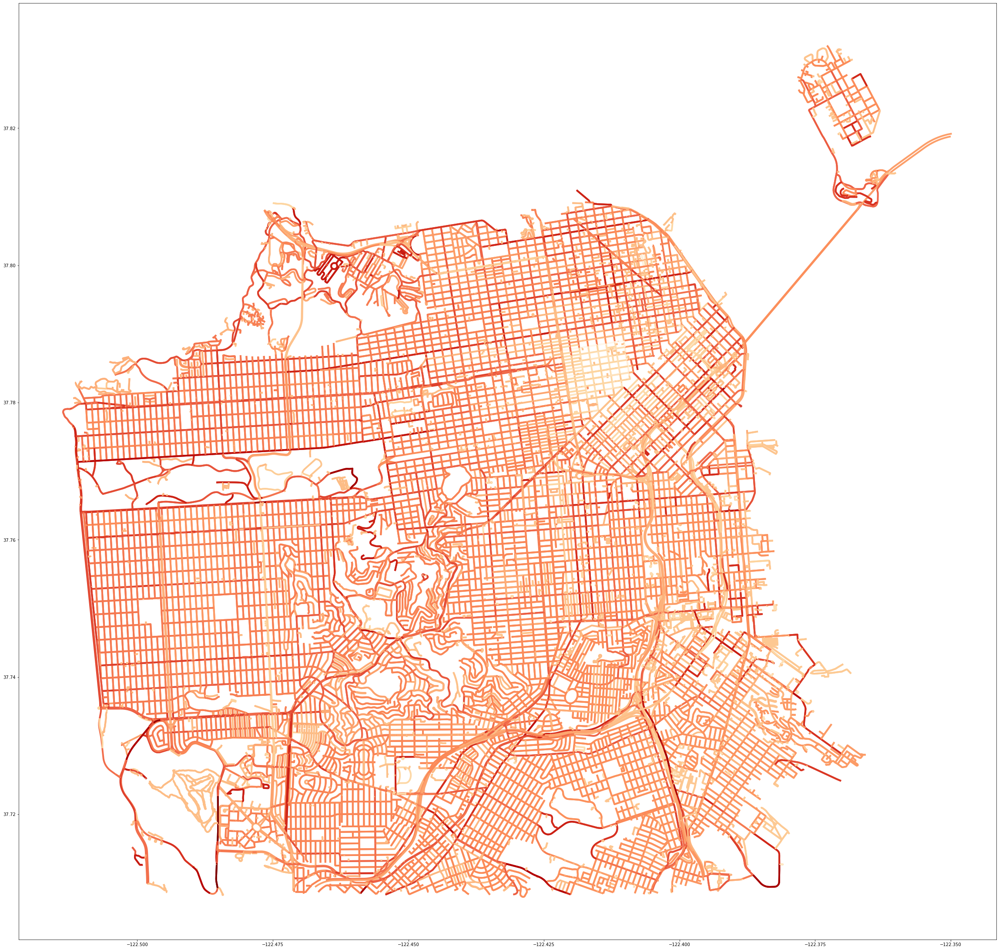

In [25]:
import matplotlib.pyplot as plt
import geopandas
fig, ax = plt.subplots(figsize=(32,40))
osmnx.plot(ax=ax, linewidth=4, column='Over_pct', cmap='OrRd')
plt.tight_layout()

## 4.2 <a name="4_2"></a> Precentage of cars exceeding speed limit more than 5 mph - O5mph_pct

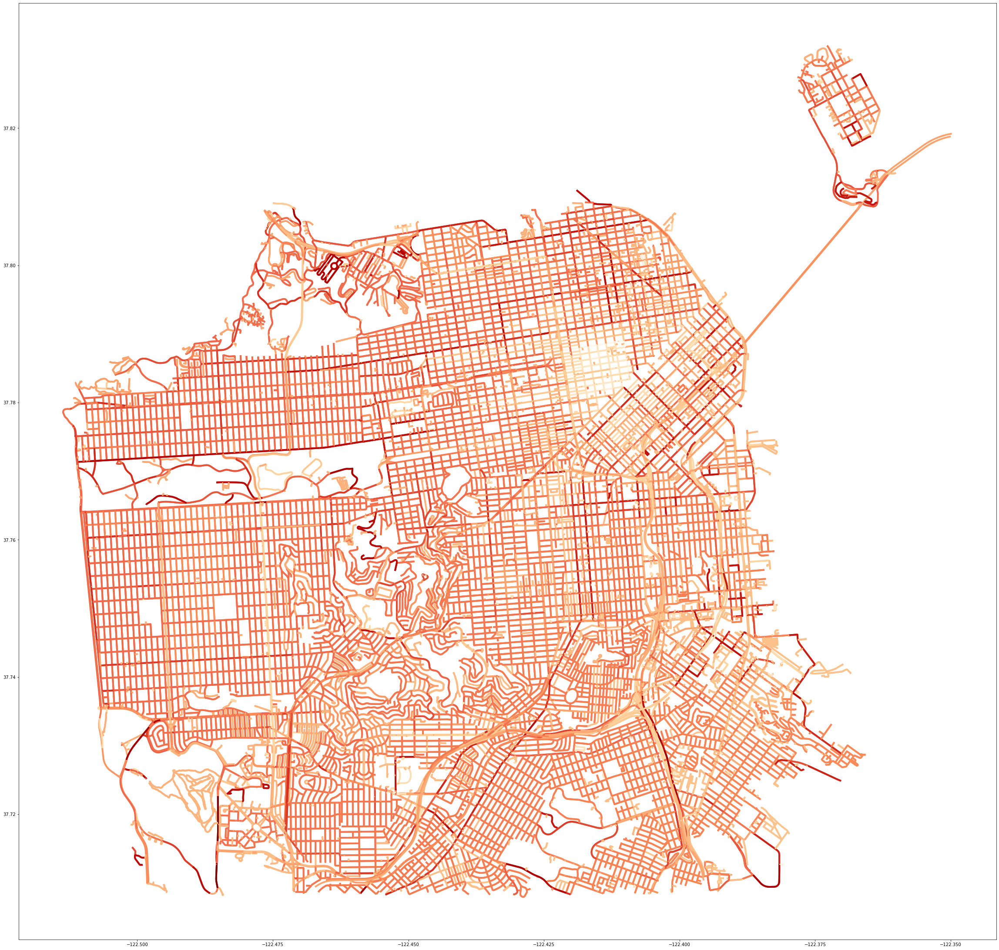

In [26]:
fig, ax = plt.subplots(figsize=(32,40))
osmnx.plot(ax=ax, linewidth=4, column='O5mph_pct', cmap='OrRd')
plt.tight_layout()

## 4.3 <a name="4_3"></a> Average speed - Speed_avg

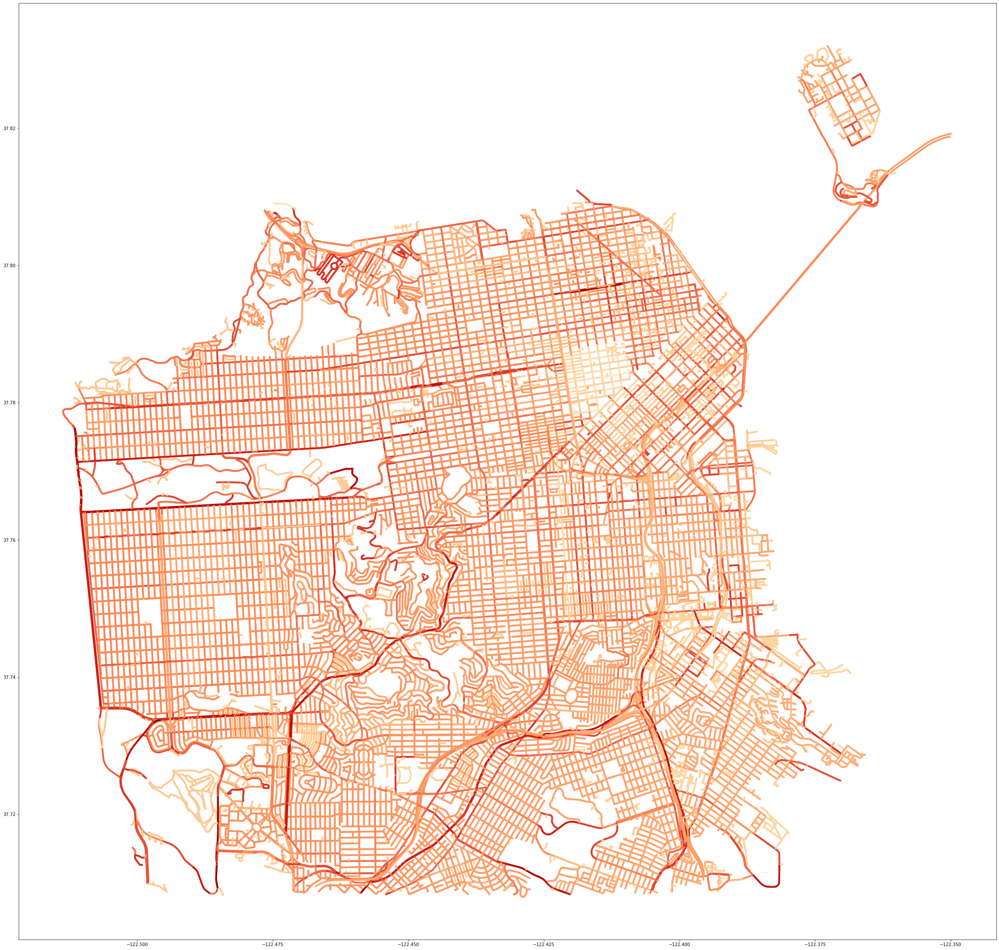

In [27]:
fig, ax = plt.subplots(figsize=(32,40))
osmnx.plot(ax=ax, linewidth=4, column='Speed_avg', cmap='OrRd')
plt.tight_layout()

## 4.4 <a name="4_4"></a> Average speed ovet speed limit - SpeedO_avg 

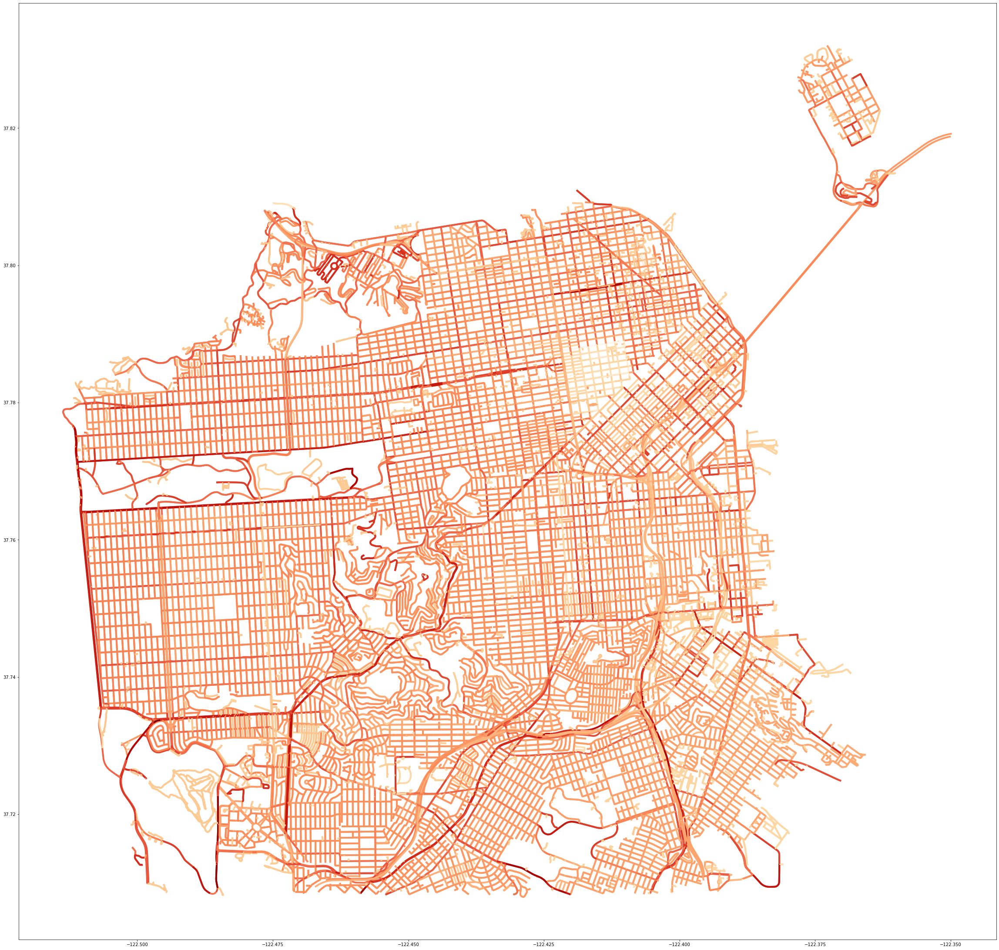

In [28]:
fig, ax = plt.subplots(figsize=(32,40))
osmnx.plot(ax=ax, linewidth=4, column='SpeedO_avg', cmap='OrRd')
plt.tight_layout()

## 4.5 <a name="4_5"></a> Average speed of cars exceeding speed limit for more than 5 mph - Spd5O_avg

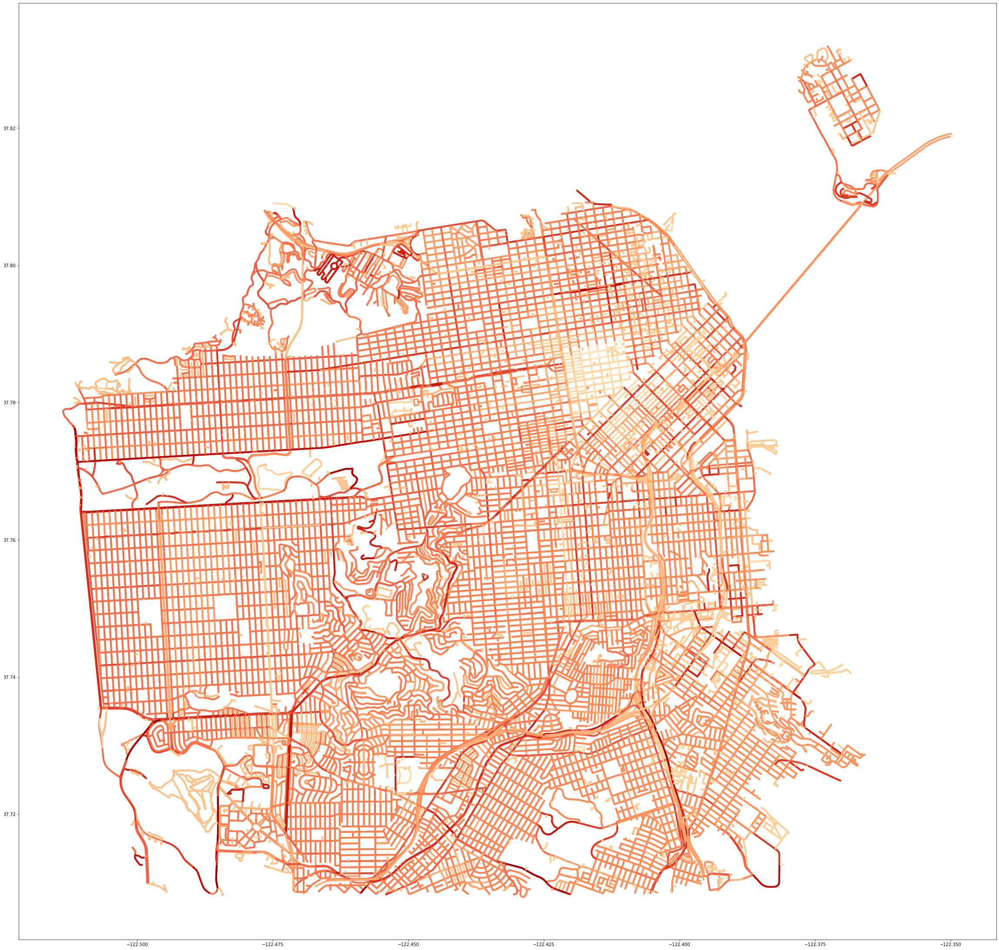

In [29]:
fig, ax = plt.subplots(figsize=(32,40))
osmnx.plot(ax=ax, linewidth=4, column='Spd5O_avg', cmap='OrRd')
plt.tight_layout()